# Dataset - 1

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [2]:
file_path = r'C:\Users\ashva\Work\christ\internship\Feynn Labs\Projects\Project 2\Codes\Code-2\EV-datasets\behavioural_segment_data.csv'
df = pd.read_csv(file_path)
df

,Age,Profession,Marrital Status,Education,No of Dependents,Personal loan,Total Salary,Price
0,27,Salaried,Single,Post Graduate,0,Yes,800000,800000
1,35,Salaried,Married,Post Graduate,2,Yes,2000000,1000000
2,45,Business,Married,Graduate,4,Yes,1800000,1200000
3,41,Business,Married,Post Graduate,3,No,2200000,1200000
4,31,Salaried,Married,Post Graduate,2,Yes,2600000,1600000
...,...,...,...,...,...,...,...,...
94,27,Business,Single,Graduate,0,No,2400000,1600000
95,50,Salaried,Married,Post Graduate,3,No,5100000,1600000
96,51,Business,Married,Graduate,2,Yes,2200000,1100000
97,51,Salaried,Married,Post Graduate,2,No,4000000,1500000


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Age               99 non-null     int64 
 1   Profession        99 non-null     object
 2   Marrital Status   99 non-null     object
 3   Education         99 non-null     object
 4   No of Dependents  99 non-null     int64 
 5   Personal loan     99 non-null     object
 6   Total Salary      99 non-null     int64 
 7   Price             99 non-null     int64 
dtypes: int64(4), object(4)
memory usage: 6.3+ KB


In [4]:
pd.isnull(df).sum()

Age                 0
Profession          0
Marrital Status     0
Education           0
No of Dependents    0
Personal loan       0
Total Salary        0
Price               0
dtype: int64

In [5]:
df.describe()

,Age,No of Dependents,Total Salary,Price
count,99.000000,99.000000,9.900000e+01,9.900000e+01
mean,36.313131,2.181818,2.270707e+06,1.194040e+06
std,6.246054,1.335265,1.050777e+06,4.376955e+05
min,26.000000,0.000000,2.000000e+05,1.100000e+05
25%,31.000000,2.000000,1.550000e+06,8.000000e+05
50%,36.000000,2.000000,2.100000e+06,1.200000e+06
75%,41.000000,3.000000,2.700000e+06,1.500000e+06
max,51.000000,4.000000,5.200000e+06,3.000000e+06


In [6]:
def plot_profession_count(data):
    """
    Plot the count of Salaried and Business in the data.

    Args:
        data (pandas.DataFrame): Data containing 'Gender' column.
    """
    labels = ['Salaried', 'Business']
    sizes = [
        data.query('Profession == "Business"').Profession.count(),
        data.query('Profession == "Salaried"').Profession.count()
    ]
    c = ['#ffdaB9', '#66b3ff']
    explode = (0.05, 0.05)

    plt.figure(figsize=(8, 8))
    my_circle = plt.Circle((0, 0), 0.7, color='white')

    plt.pie(
        sizes,
        colors=c,
        labels=labels,
        autopct='%1.1f%%',
        startangle=90,
        pctdistance=0.85,
        explode=explode
    )

    p = plt.gcf()
    plt.axis('equal')
    p.gca().add_artist(my_circle)

    plt.show()

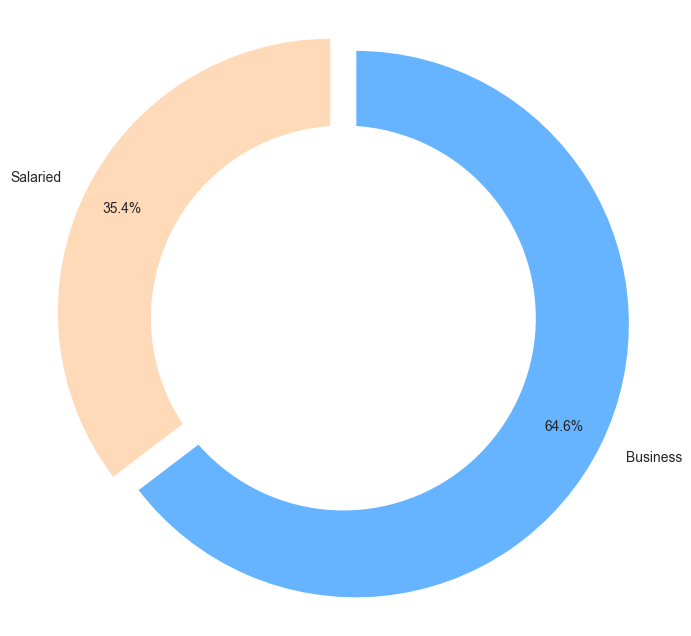

In [7]:
plot_profession_count(df)

In [8]:
def plot_age_count(data):
    """
    Plot the count of age using Seaborn.

    Args:
        data (pandas.DataFrame): Data containing 'Age' column.
    """
    plt.figure(figsize=(15, 10))
    sns.countplot(data=data, x='Age')

    # Set labels and title
    plt.xlabel('Age')
    plt.ylabel('Count')
    plt.title('Count of Age')

    # Display the plot
    plt.show()

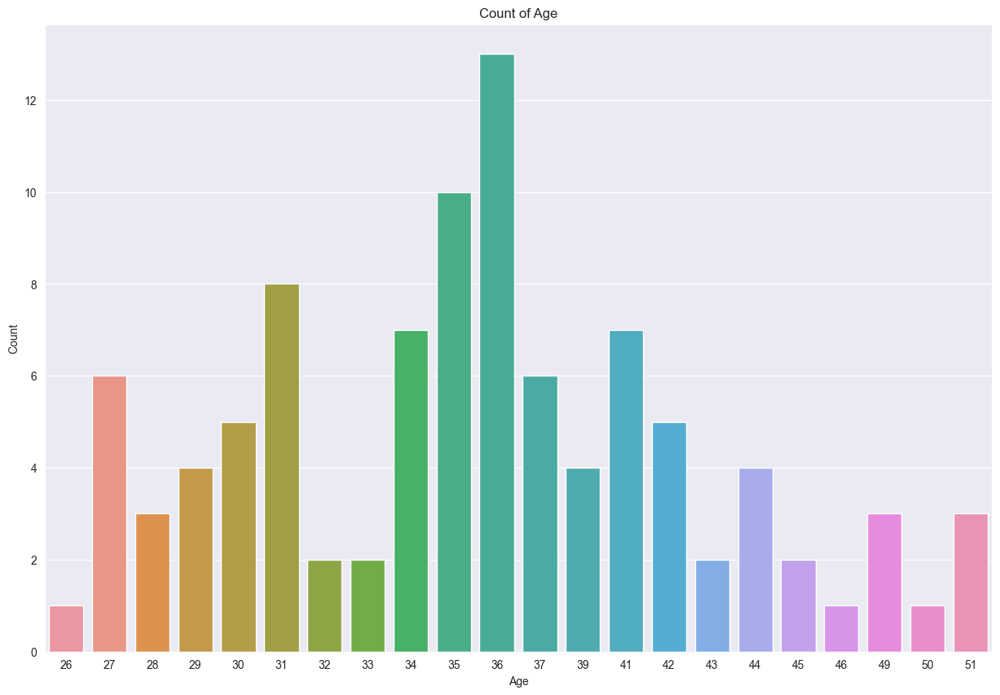

In [9]:
plot_age_count(df)

In [10]:
def preprocess_data(data):
    """
    Preprocess the data by converting columns to their respective representations.

    Args:
        data (pandas.DataFrame): Input data.

    Returns:
        pandas.DataFrame: Preprocessed data.
    """
    processed_data = data.copy()
    categorical_columns = processed_data.select_dtypes(include='object').columns
    numeric_columns = processed_data.select_dtypes(include=['int', 'float']).columns

    # Convert categorical columns
    processed_data[categorical_columns] = processed_data[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

    # Scale numeric columns
    scaler = StandardScaler()
    processed_data[numeric_columns] = scaler.fit_transform(processed_data[numeric_columns])

    return processed_data

In [11]:
preprocessed_data = preprocess_data(df)

In [12]:
def perform_pca(data):
    """
    Perform Principal Component Analysis (PCA) on the data.

    Args:
        data (pandas.DataFrame): Data to perform PCA on.

    Returns:
        numpy.ndarray: Resulting PCA components.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    pca = PCA()
    pca_res = pca.fit_transform(data_scaled)

    for iteration in range(pca.n_components_):
        print(f"PC{iteration + 1}")
        print(f"Standard deviation: {np.round(np.sqrt(pca.explained_variance_[iteration]), 4)}")
        print(f"Proportion of Variance: {np.round(pca.explained_variance_ratio_[iteration], 4)}")
        print(f"Cumulative Proportion: {np.round(np.sum(pca.explained_variance_ratio_[:iteration+1]), 4)}")
        print()

    return pca_res

In [13]:
pca_result = perform_pca(preprocessed_data)

PC1
Standard deviation: 1.6735
Proportion of Variance: 0.3465
Cumulative Proportion: 0.3465

PC2
Standard deviation: 1.246
Proportion of Variance: 0.1921
Cumulative Proportion: 0.5386

PC3
Standard deviation: 1.0762
Proportion of Variance: 0.1433
Cumulative Proportion: 0.6819

PC4
Standard deviation: 0.9549
Proportion of Variance: 0.1128
Cumulative Proportion: 0.7948

PC5
Standard deviation: 0.8444
Proportion of Variance: 0.0882
Cumulative Proportion: 0.883

PC6
Standard deviation: 0.629
Proportion of Variance: 0.0489
Cumulative Proportion: 0.9319

PC7
Standard deviation: 0.6039
Proportion of Variance: 0.0451
Cumulative Proportion: 0.9771

PC8
Standard deviation: 0.4304
Proportion of Variance: 0.0229
Cumulative Proportion: 1.0



In [14]:
def find_optimal_clusters(data, max_clusters=10, n_init=10):
    """
    Find the optimal number of clusters using the elbow method.

    Args:
        data (numpy.ndarray): Data to cluster.
        max_clusters (int): Maximum number of clusters to consider.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        int: Optimal number of clusters.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    wcss = []
    for num_clusters in range(1, max_clusters+1):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=n_init)
        kmeans.fit(data_scaled)
        wcss.append(kmeans.inertia_)

    # Plot the WCSS values
    plt.plot(range(1, max_clusters+1), wcss)
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    # Calculate the optimal number of clusters
    differences = np.diff(wcss)
    avg_differences = []
    for i in range(1, len(differences)):
        avg_differences.append((differences[i] - differences[i-1]) / differences[i-1])

    optimal_clusters = np.argmax(avg_differences) + 1
    return optimal_clusters

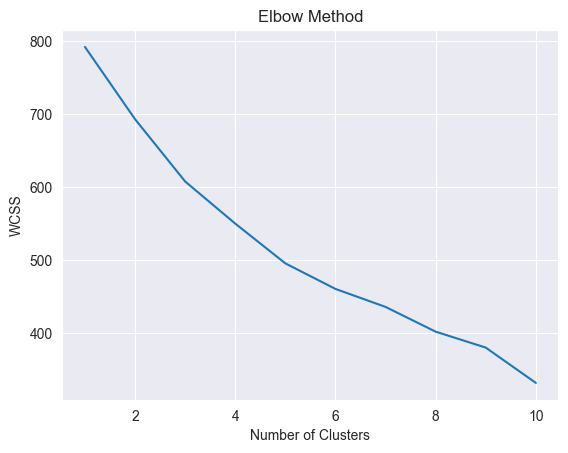

In [15]:
ideal_n_clusters = find_optimal_clusters(pca_result)

In [16]:
ideal_n_clusters

8

In [17]:
def apply_kmeans_clustering(data, n_clusters, n_init=10):
    """
    Apply K-means Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        n_clusters (int): Number of clusters.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_init)
    clusters = kmeans.fit_predict(data_scaled)

    sns.set(style="ticks")
    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.suptitle('Scatter Plot with K-means Clusters', y=1.05)
    plt.show()

    return clusters

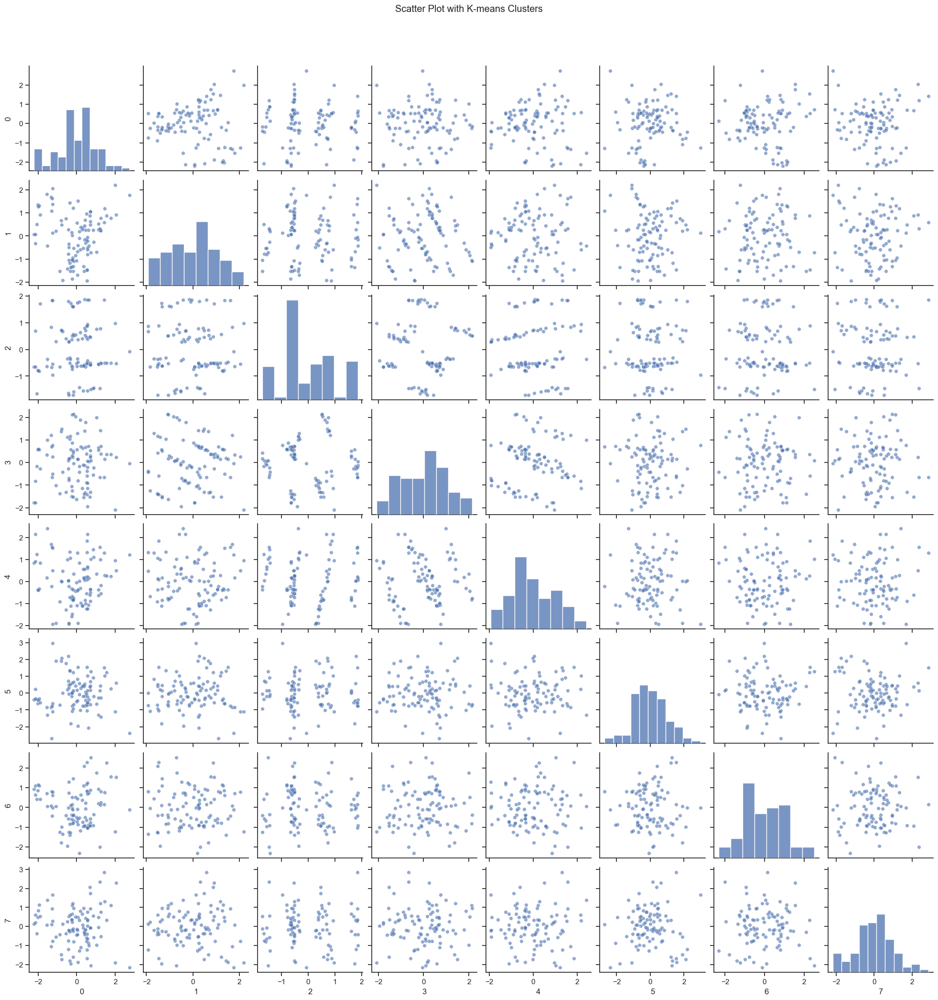

In [18]:
kmeans_clusters = apply_kmeans_clustering(pca_result, ideal_n_clusters)

In [19]:
def apply_hierarchical_clustering(data, distance_threshold=None):
    """
    Apply Hierarchical Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        distance_threshold (float): The linkage distance threshold above which clusters will not be merged.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None)
    model.fit(data_scaled)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    dendrogram(linkage(data_scaled, method='ward'))
    plt.show()

    clusters = model.labels_

    print(f'Scatter Plot with Hierarchical Clusters (Number of Clusters: {len(np.unique(clusters))})')

    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.show()

    return clusters

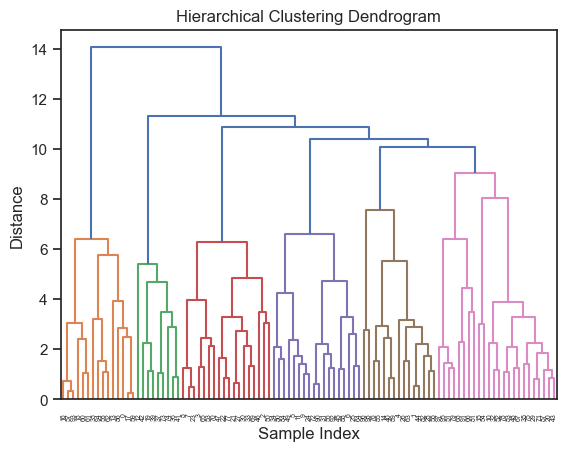

Scatter Plot with Hierarchical Clusters (Number of Clusters: 42)


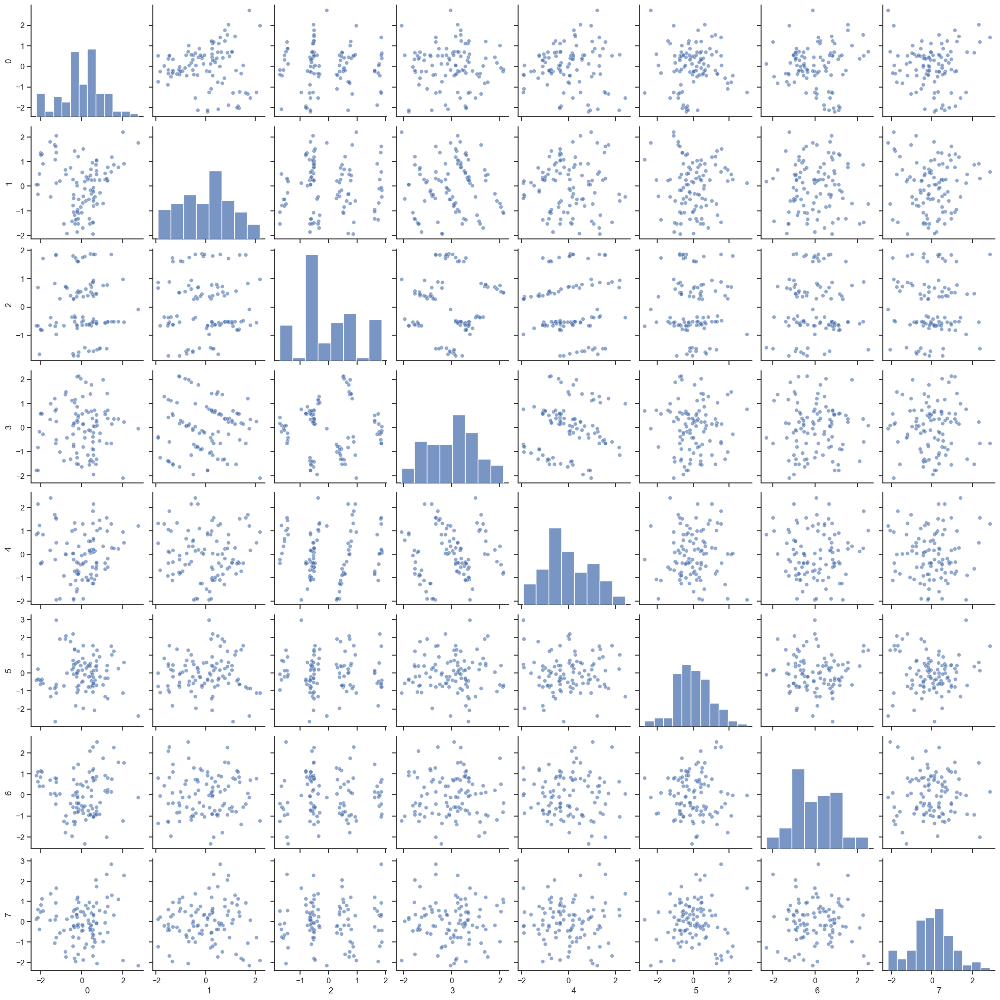

In [20]:
hierarchical_clusters = apply_hierarchical_clustering(pca_result, distance_threshold=2.5)

In [21]:
# Analyze the clusters
def analyze_clusters(data, clusters):
    """
    Analyze the clusters by displaying cluster distribution and percentages.

    Args:
        data (pandas.DataFrame): Data with cluster labels.
        clusters (numpy.ndarray): Cluster labels.
    """
    data['Cluster'] = clusters

    cluster_counts = data['Cluster'].value_counts().sort_index()
    cluster_percentages = cluster_counts / cluster_counts.sum() * 100

    print("Cluster Distribution:")
    print(cluster_counts)
    print()
    print("Cluster Percentages:")
    print(cluster_percentages)

In [22]:
# Analyze the K-means clusters
analyze_clusters(df, kmeans_clusters)

Cluster Distribution:
Cluster
0    14
1    13
2    11
3     8
4     6
5    10
6    19
7    18
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    14.141414
1    13.131313
2    11.111111
3     8.080808
4     6.060606
5    10.101010
6    19.191919
7    18.181818
Name: count, dtype: float64


In [23]:
# Analyze the Hierarchical clusters
analyze_clusters(df, hierarchical_clusters)

Cluster Distribution:
Cluster
0     3
1     4
2     3
3     3
4     2
5     7
6     5
7     5
8     3
9     3
10    4
11    3
12    3
13    3
14    4
15    3
16    1
17    5
18    1
19    2
20    2
21    3
22    1
23    3
24    1
25    2
26    1
27    2
28    2
29    1
30    1
31    1
32    1
33    1
34    1
35    2
36    2
37    1
38    1
39    1
40    1
41    1
Name: count, dtype: int64

Cluster Percentages:
Cluster
0     3.030303
1     4.040404
2     3.030303
3     3.030303
4     2.020202
5     7.070707
6     5.050505
7     5.050505
8     3.030303
9     3.030303
10    4.040404
11    3.030303
12    3.030303
13    3.030303
14    4.040404
15    3.030303
16    1.010101
17    5.050505
18    1.010101
19    2.020202
20    2.020202
21    3.030303
22    1.010101
23    3.030303
24    1.010101
25    2.020202
26    1.010101
27    2.020202
28    2.020202
29    1.010101
30    1.010101
31    1.010101
32    1.010101
33    1.010101
34    1.010101
35    2.020202
36    2.020202
37    1.010101
38    1.

# Dataset - 2

In [2]:
file_path_1 = r'C:\Users\ashva\Work\christ\internship\Feynn Labs\Projects\Project 2\Codes\Code-2\EV-datasets\ElectricCarData_Clean.csv'
df1 = pd.read_csv(file_path_1)
df1

,Brand,Model,AccelSec,TopSpeed_KmH,Range_Km,Efficiency_WhKm,FastCharge_KmH,RapidCharge,PowerTrain,PlugType,BodyStyle,Segment,Seats,PriceEuro
0,Tesla,Model 3 Long Range Dual Motor,4.6,233,450,161,940,Yes,AWD,Type 2 CCS,Sedan,D,5,55480
1,Volkswagen,ID.3 Pure,10.0,160,270,167,250,Yes,RWD,Type 2 CCS,Hatchback,C,5,30000
2,Polestar,2,4.7,210,400,181,620,Yes,AWD,Type 2 CCS,Liftback,D,5,56440
3,BMW,iX3,6.8,180,360,206,560,Yes,RWD,Type 2 CCS,SUV,D,5,68040
4,Honda,e,9.5,145,170,168,190,Yes,RWD,Type 2 CCS,Hatchback,B,4,32997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,Nissan,Ariya 63kWh,7.5,160,330,191,440,Yes,FWD,Type 2 CCS,Hatchback,C,5,45000
99,Audi,e-tron S Sportback 55 quattro,4.5,210,335,258,540,Yes,AWD,Type 2 CCS,SUV,E,5,96050
100,Nissan,Ariya e-4ORCE 63kWh,5.9,200,325,194,440,Yes,AWD,Type 2 CCS,Hatchback,C,5,50000
101,Nissan,Ariya e-4ORCE 87kWh Performance,5.1,200,375,232,450,Yes,AWD,Type 2 CCS,Hatchback,C,5,65000


In [25]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Brand            103 non-null    object 
 1   Model            103 non-null    object 
 2   AccelSec         103 non-null    float64
 3   TopSpeed_KmH     103 non-null    int64  
 4   Range_Km         103 non-null    int64  
 5   Efficiency_WhKm  103 non-null    int64  
 6   FastCharge_KmH   103 non-null    object 
 7   RapidCharge      103 non-null    object 
 8   PowerTrain       103 non-null    object 
 9   PlugType         103 non-null    object 
 10  BodyStyle        103 non-null    object 
 11  Segment          103 non-null    object 
 12  Seats            103 non-null    int64  
 13  PriceEuro        103 non-null    int64  
dtypes: float64(1), int64(5), object(8)
memory usage: 11.4+ KB


In [26]:
pd.isnull(df1).sum()

Brand              0
Model              0
AccelSec           0
TopSpeed_KmH       0
Range_Km           0
Efficiency_WhKm    0
FastCharge_KmH     0
RapidCharge        0
PowerTrain         0
PlugType           0
BodyStyle          0
Segment            0
Seats              0
PriceEuro          0
dtype: int64

In [27]:
df1.describe()

,AccelSec,TopSpeed_KmH,Range_Km,Efficiency_WhKm,Seats,PriceEuro
count,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000
mean,7.396117,179.194175,338.786408,189.165049,4.883495,55811.563107
std,3.017430,43.573030,126.014444,29.566839,0.795834,34134.665280
min,2.100000,123.000000,95.000000,104.000000,2.000000,20129.000000
25%,5.100000,150.000000,250.000000,168.000000,5.000000,34429.500000
50%,7.300000,160.000000,340.000000,180.000000,5.000000,45000.000000
75%,9.000000,200.000000,400.000000,203.000000,5.000000,65000.000000
max,22.400000,410.000000,970.000000,273.000000,7.000000,215000.000000


In [28]:
def plot_bodystyle_count(data):
    """
    Plot the count of BodyStyle in the data.

    Args:
        data (pandas.DataFrame): Data containing 'Gender' column.
    """
    BS=[]

    for index in df1['BodyStyle']:
        BS.append(index)

    unique_list = list(set(BS))

    sizes=[]
    for index in unique_list:
         sizes.append(data.query(f'BodyStyle == "{index}"').BodyStyle.count())

    plt.figure(figsize=(8, 8))
    my_circle = plt.Circle((0, 0), 0.7, color='white')

    plt.pie(
        sizes,
        labels=unique_list,
        autopct='%1.1f%%',
        pctdistance=0.85
    )

    p = plt.gcf()
    plt.axis('equal')
    p.gca().add_artist(my_circle)

    plt.show()

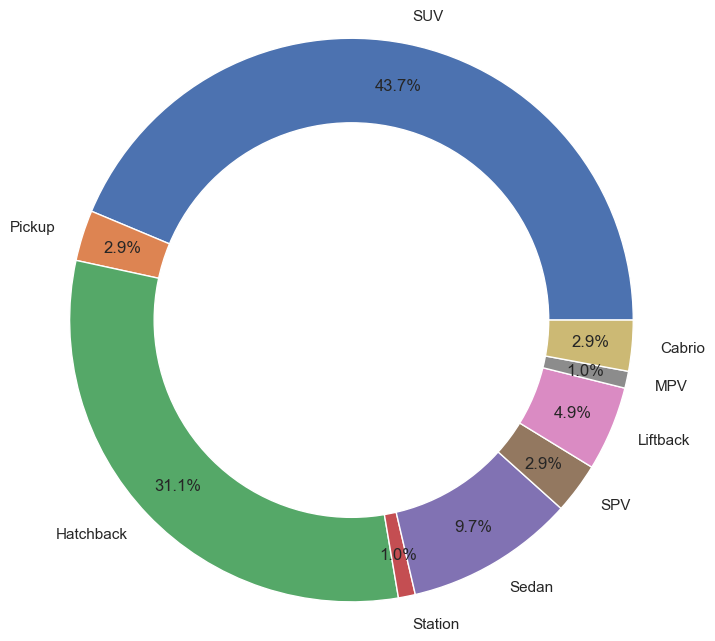

In [29]:
plot_bodystyle_count(df1)

In [30]:
def plot_brand_count(d):
    """
    Plot the count of Brand using Seaborn.

    Args:
        d (pandas.DataFrame): Data containing 'Brand' column.
    """
    plt.figure(figsize=(30, 20))
    sns.countplot(data=d, x='Brand')

    # Set labels and title
    plt.xlabel('Brand')
    plt.ylabel('Count')
    plt.title('Count of Brand')

    # Display the plot
    plt.show()

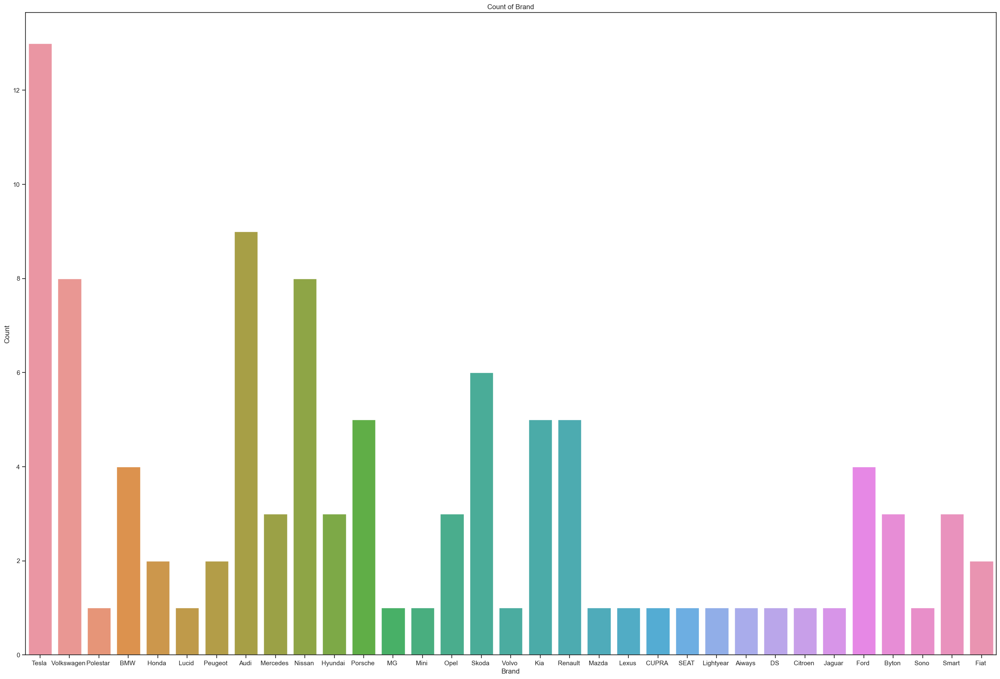

In [31]:
plot_brand_count(df1)

In [3]:
def preprocess_data(data):
    """
    Preprocess the data by converting columns to their respective representations.

    Args:
        data (pandas.DataFrame): Input data.

    Returns:
        pandas.DataFrame: Preprocessed data.
    """
    processed_data = data.copy()
    categorical_columns = processed_data.select_dtypes(include='object').columns
    numeric_columns = processed_data.select_dtypes(include=['int', 'float']).columns

    # Convert categorical columns
    processed_data[categorical_columns] = processed_data[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

    # Scale numeric columns
    scaler = StandardScaler()
    processed_data[numeric_columns] = scaler.fit_transform(processed_data[numeric_columns])

    return processed_data

In [4]:
preprocessed_data_1 = preprocess_data(df1)

In [5]:
# Perform Principal Component Analysis (PCA)
def perform_pca(data):
    """
    Perform Principal Component Analysis (PCA) on the data.

    Args:
        data (pandas.DataFrame): Data to perform PCA on.

    Returns:
        numpy.ndarray: Resulting PCA components.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    pca = PCA()
    pca_res = pca.fit_transform(data_scaled)

    for iteration in range(pca.n_components_):
        print(f"PC{iteration + 1}")
        print(f"Standard deviation: {np.round(np.sqrt(pca.explained_variance_[iteration]), 4)}")
        print(f"Proportion of Variance: {np.round(pca.explained_variance_ratio_[iteration], 4)}")
        print(f"Cumulative Proportion: {np.round(np.sum(pca.explained_variance_ratio_[:iteration+1]), 4)}")
        print()

    return pca_res

In [6]:
pca_result_1 = perform_pca(preprocessed_data_1)

PC1
Standard deviation: 2.3903
Proportion of Variance: 0.4041
Cumulative Proportion: 0.4041

PC2
Standard deviation: 1.3607
Proportion of Variance: 0.131
Cumulative Proportion: 0.5351

PC3
Standard deviation: 1.237
Proportion of Variance: 0.1082
Cumulative Proportion: 0.6433

PC4
Standard deviation: 1.1428
Proportion of Variance: 0.0924
Cumulative Proportion: 0.7357

PC5
Standard deviation: 0.9176
Proportion of Variance: 0.0596
Cumulative Proportion: 0.7953

PC6
Standard deviation: 0.7892
Proportion of Variance: 0.0441
Cumulative Proportion: 0.8393

PC7
Standard deviation: 0.7768
Proportion of Variance: 0.0427
Cumulative Proportion: 0.882

PC8
Standard deviation: 0.6576
Proportion of Variance: 0.0306
Cumulative Proportion: 0.9126

PC9
Standard deviation: 0.6341
Proportion of Variance: 0.0284
Cumulative Proportion: 0.9411

PC10
Standard deviation: 0.5222
Proportion of Variance: 0.0193
Cumulative Proportion: 0.9603

PC11
Standard deviation: 0.4505
Proportion of Variance: 0.0144
Cumulativ

In [7]:
def find_optimal_clusters(data, max_clusters=10, n_init=10):
    """
    Find the optimal number of clusters using the elbow method.

    Args:
        data (numpy.ndarray): Data to cluster.
        max_clusters (int): Maximum number of clusters to consider.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        int: Optimal number of clusters.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    wcss = []
    for num_clusters in range(1, max_clusters+1):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=n_init)
        kmeans.fit(data_scaled)
        wcss.append(kmeans.inertia_)

    # Plot the WCSS values
    plt.plot(range(1, max_clusters+1), wcss)
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    # Calculate the optimal number of clusters
    differences = np.diff(wcss)
    avg_differences = []
    for i in range(1, len(differences)):
        avg_differences.append((differences[i] - differences[i-1]) / differences[i-1])

    optimal_clusters = np.argmax(avg_differences) + 1
    return optimal_clusters

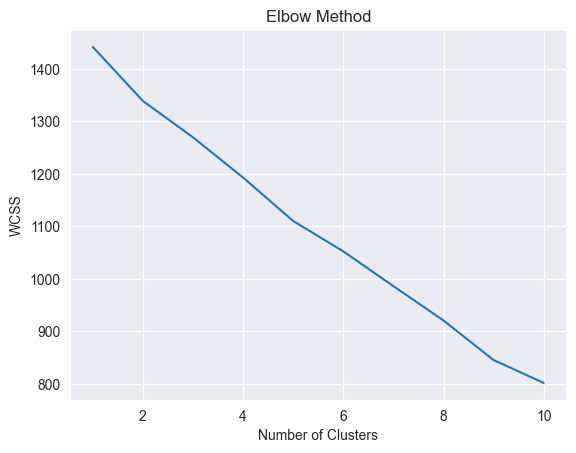

In [8]:
ideal_n_clusters_1 = find_optimal_clusters(pca_result_1)

In [9]:
ideal_n_clusters_1

7

In [10]:
def apply_kmeans_clustering(data, n_clusters, n_init=10):
    """
    Apply K-means Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        n_clusters (int): Number of clusters.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_init)
    clusters = kmeans.fit_predict(data_scaled)

    sns.set(style="ticks")
    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.suptitle('Scatter Plot with K-means Clusters', y=1.05)
    plt.show()

    return clusters

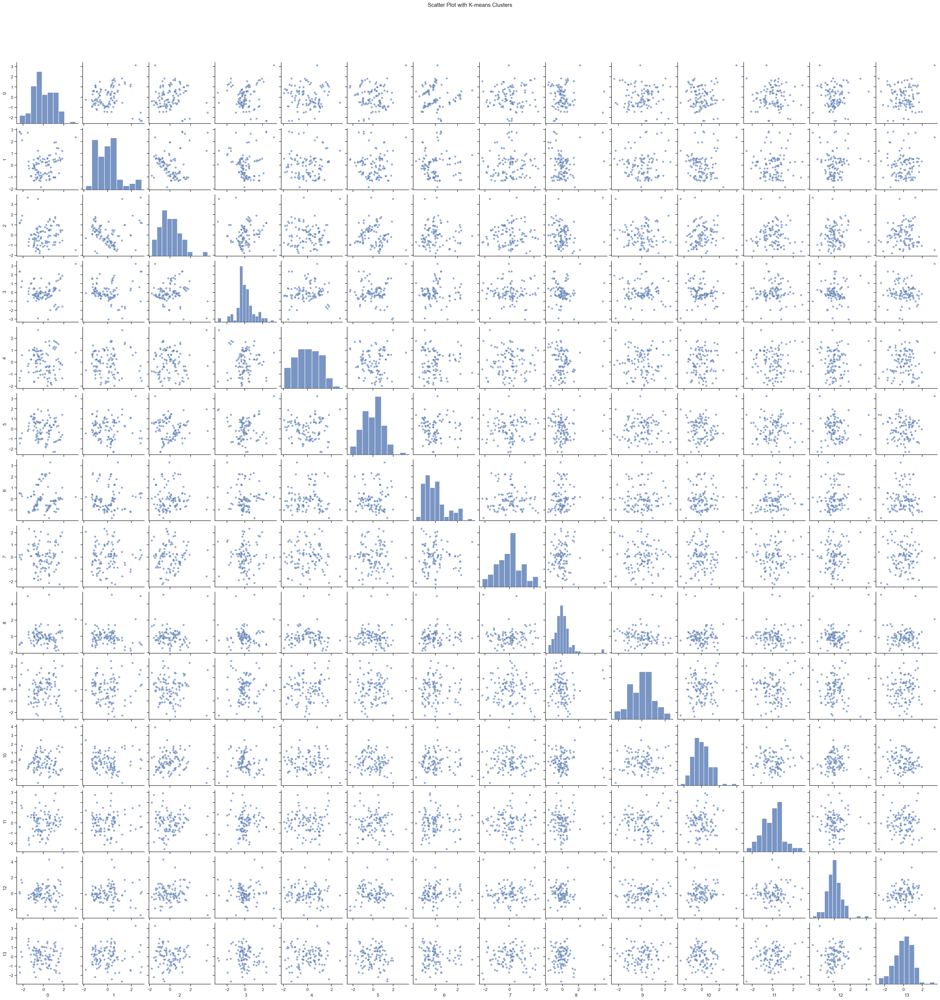

In [11]:
kmeans_clusters_1 = apply_kmeans_clustering(pca_result_1, ideal_n_clusters_1)

In [14]:
def apply_hierarchical_clustering(data, distance_threshold=None):
    """
    Apply Hierarchical Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        distance_threshold (float): The linkage distance threshold above which clusters will not be merged.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None)
    model.fit(data_scaled)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    dendrogram(linkage(data_scaled, method='ward'))
    plt.show()

    clusters = model.labels_

    print(f'Scatter Plot with Hierarchical Clusters (Number of Clusters: {len(np.unique(clusters))})')

    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.show()

    return clusters

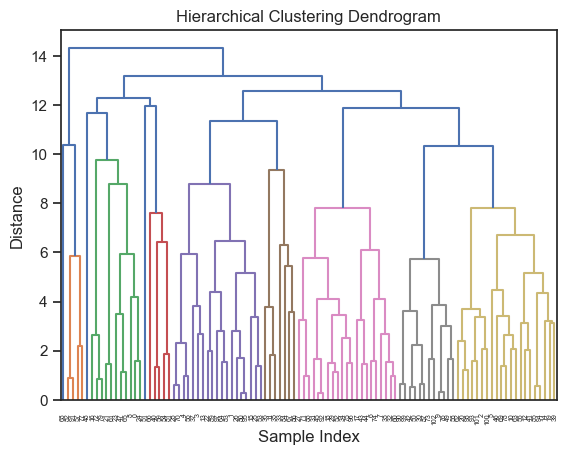

Scatter Plot with Hierarchical Clusters (Number of Clusters: 61)


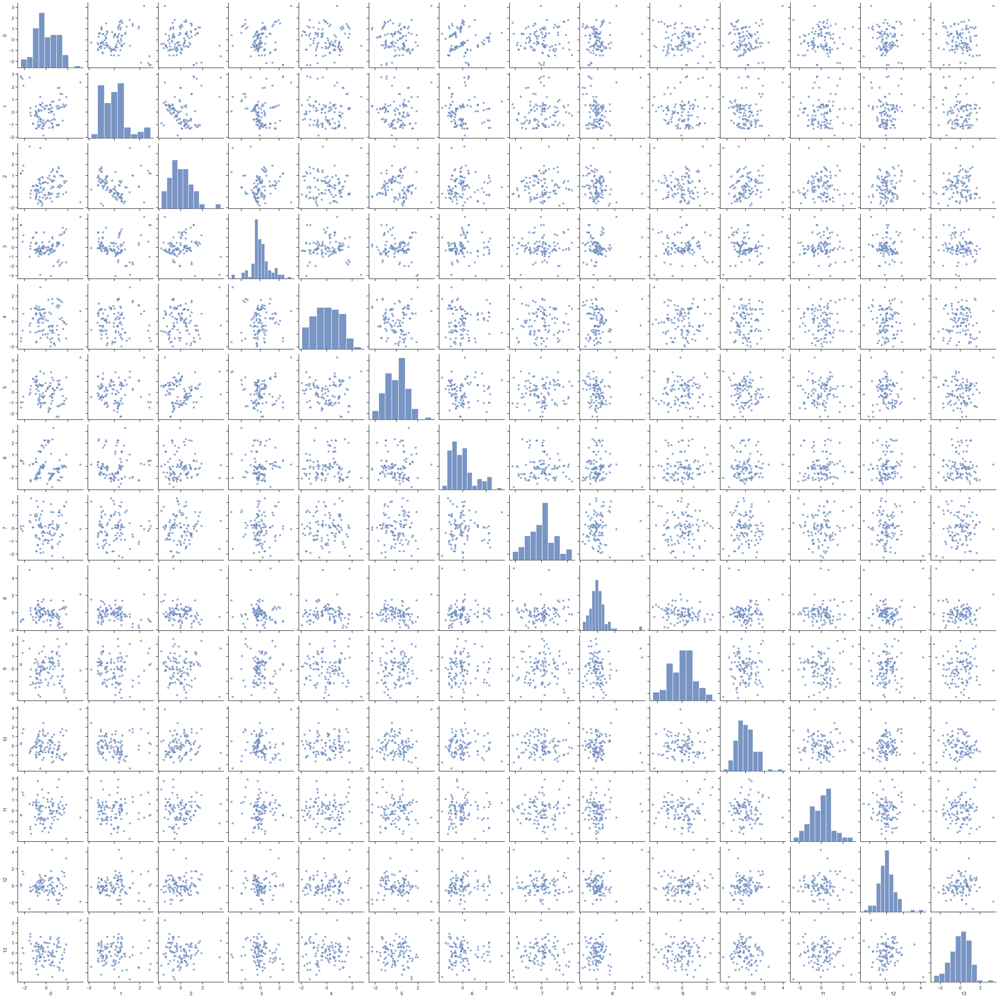

In [15]:
hierarchical_clusters_1 = apply_hierarchical_clustering(pca_result_1, distance_threshold=2.5)

In [43]:
# Analyze the clusters
def analyze_clusters(data, clusters):
    """
    Analyze the clusters by displaying cluster distribution and percentages.

    Args:
        data (pandas.DataFrame): Data with cluster labels.
        clusters (numpy.ndarray): Cluster labels.
    """
    data['Cluster'] = clusters

    cluster_counts = data['Cluster'].value_counts().sort_index()
    cluster_percentages = cluster_counts / cluster_counts.sum() * 100

    print("Cluster Distribution:")
    print(cluster_counts)
    print()
    print("Cluster Percentages:")
    print(cluster_percentages)

In [44]:
# Analyze the K-means clusters
analyze_clusters(df1, kmeans_clusters_1)

Cluster Distribution:
Cluster
0    15
1    17
2    36
3     5
4    25
5     1
6     4
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    14.563107
1    16.504854
2    34.951456
3     4.854369
4    24.271845
5     0.970874
6     3.883495
Name: count, dtype: float64


In [45]:
# Analyze the Hierarchical clusters
analyze_clusters(df1, hierarchical_clusters_1)

Cluster Distribution:
Cluster
0     3
1     2
2     4
3     2
4     2
     ..
56    1
57    1
58    1
59    1
60    1
Name: count, Length: 61, dtype: int64

Cluster Percentages:
Cluster
0     2.912621
1     1.941748
2     3.883495
3     1.941748
4     1.941748
        ...   
56    0.970874
57    0.970874
58    0.970874
59    0.970874
60    0.970874
Name: count, Length: 61, dtype: float64


# Dataset - 3

In [46]:
file_path_2 = r'C:\Users\ashva\Work\christ\internship\Feynn Labs\Projects\Project 2\Codes\Code-2\EV-datasets\EV_Cars_Cleaned.csv'
df2 = pd.read_csv(file_path_2)
df2

,ModelName,Brand,Price,Power(kW),Mileage(km)
0,Audi e-tron,Audi,10200000,95.00,359.0
1,Audi e-tron GT,Audi,17000000,93.40,388.0
2,Audi RS e-tron GT,Audi,19300000,93.40,401.0
3,BMW i4,BMW,19500000,101.00,590.0
4,BMW i7,BMW,12100000,71.00,372.0
5,BMW iX,BMW,11900000,90.00,200.0
6,BYD Atto 3,BYD,15900000,107.00,857.0
7,BYD E6,BYD,15300000,79.20,395.0
8,Citroen eC3,Citroen,7390000,83.90,493.0
9,Hyundai IONIQ 5,Hyundai,3399000,60.40,521.0


In [47]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ModelName    30 non-null     object 
 1   Brand        30 non-null     object 
 2   Price        30 non-null     int64  
 3   Power(kW)    30 non-null     float64
 4   Mileage(km)  30 non-null     float64
dtypes: float64(2), int64(1), object(2)
memory usage: 1.3+ KB


In [48]:
pd.isnull(df2).sum()

ModelName      0
Brand          0
Price          0
Power(kW)      0
Mileage(km)    0
dtype: int64

In [49]:
df2.describe()

,Price,Power(kW),Mileage(km)
count,3.000000e+01,30.000000,30.000000
mean,6.433800e+06,59.980333,386.806667
std,6.060718e+06,29.301204,177.913047
min,4.500000e+05,13.410000,56.200000
25%,1.312500e+06,33.075000,280.500000
50%,4.272500e+06,68.750000,398.000000
75%,1.013750e+07,82.925000,459.750000
max,1.950000e+07,107.000000,857.000000


In [50]:
def plot_brand_count(d):
    """
    Plot the count of Brand using Seaborn.

    Args:
        d (pandas.DataFrame): Data containing 'Brand' column.
    """
    plt.figure(figsize=(30, 20))
    sns.countplot(data=d, x='Brand')

    # Set labels and title
    plt.xlabel('Brand')
    plt.ylabel('Count')
    plt.title('Count of Brand')

    # Display the plot
    plt.show()

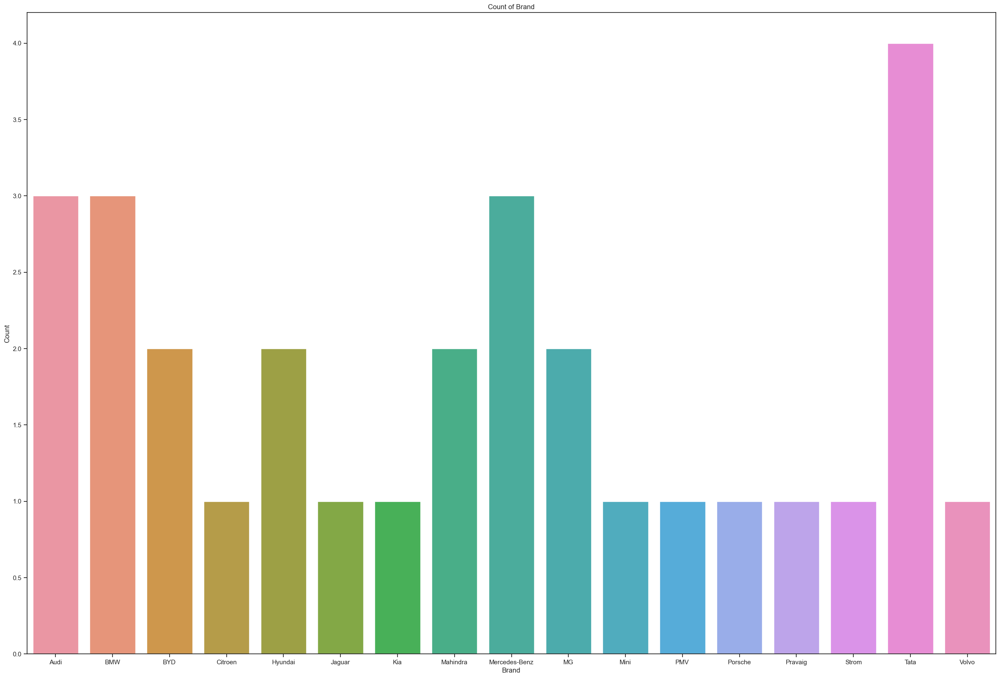

In [51]:
plot_brand_count(df2)

In [52]:
def preprocess_data(data):
    """
    Preprocess the data by converting columns to their respective representations.

    Args:
        data (pandas.DataFrame): Input data.

    Returns:
        pandas.DataFrame: Preprocessed data.
    """
    processed_data = data.copy()
    categorical_columns = processed_data.select_dtypes(include='object').columns
    numeric_columns = processed_data.select_dtypes(include=['int', 'float']).columns

    # Convert categorical columns
    processed_data[categorical_columns] = processed_data[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

    # Scale numeric columns
    scaler = StandardScaler()
    processed_data[numeric_columns] = scaler.fit_transform(processed_data[numeric_columns])

    return processed_data

In [53]:
preprocessed_data_2 = preprocess_data(df2)

In [54]:
def perform_pca(data):
    """
    Perform Principal Component Analysis (PCA) on the data.

    Args:
        data (pandas.DataFrame): Data to perform PCA on.

    Returns:
        numpy.ndarray: Resulting PCA components.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    pca = PCA()
    pca_res = pca.fit_transform(data_scaled)

    for iteration in range(pca.n_components_):
        print(f"PC{iteration + 1}")
        print(f"Standard deviation: {np.round(np.sqrt(pca.explained_variance_[iteration]), 4)}")
        print(f"Proportion of Variance: {np.round(pca.explained_variance_ratio_[iteration], 4)}")
        print(f"Cumulative Proportion: {np.round(np.sum(pca.explained_variance_ratio_[:iteration+1]), 4)}")
        print()

    return pca_res

In [55]:
pca_result_2 = perform_pca(preprocessed_data_2)

PC1
Standard deviation: 1.9125
Proportion of Variance: 0.7071
Cumulative Proportion: 0.7071

PC2
Standard deviation: 1.0285
Proportion of Variance: 0.2045
Cumulative Proportion: 0.9116

PC3
Standard deviation: 0.5513
Proportion of Variance: 0.0588
Cumulative Proportion: 0.9704

PC4
Standard deviation: 0.3831
Proportion of Variance: 0.0284
Cumulative Proportion: 0.9988

PC5
Standard deviation: 0.0797
Proportion of Variance: 0.0012
Cumulative Proportion: 1.0



In [56]:
def find_optimal_clusters(data, max_clusters=10, n_init=10):
    """
    Find the optimal number of clusters using the elbow method.

    Args:
        data (numpy.ndarray): Data to cluster.
        max_clusters (int): Maximum number of clusters to consider.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        int: Optimal number of clusters.
    """
    if max(abs(data.mean()), abs(data.std())) > 1e-8:
        scaler = StandardScaler()
        data = scaler.fit_transform(data)

    wcss = []
    for num_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=n_init)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # Calculate the optimal number of clusters
    differences = np.diff(wcss)
    avg_differences = differences[1:] / differences[:-1]

    optimal_clusters = np.argmax(avg_differences) + 1

    # Plot the WCSS values
    plt.plot(range(1, max_clusters + 1), wcss)
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    return optimal_clusters

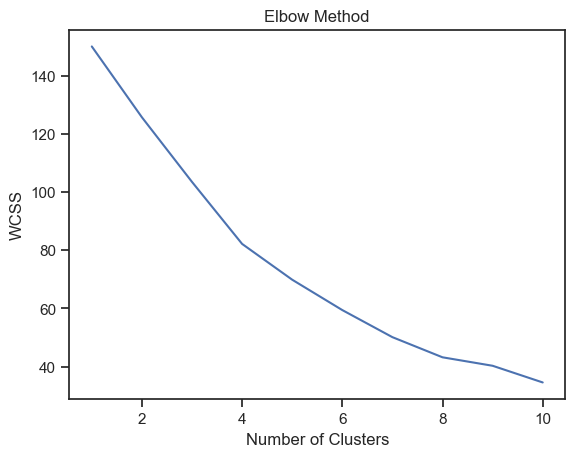

In [57]:
ideal_n_clusters_2 = find_optimal_clusters(pca_result_2)

In [58]:
ideal_n_clusters_2

8

In [59]:
def apply_kmeans_clustering(data, n_clusters, n_init=10):
    """
    Apply K-means Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        n_clusters (int): Number of clusters.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_init)
    clusters = kmeans.fit_predict(data_scaled)

    sns.set(style="ticks")
    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.suptitle('Scatter Plot with K-means Clusters', y=1.05)
    plt.show()

    return clusters

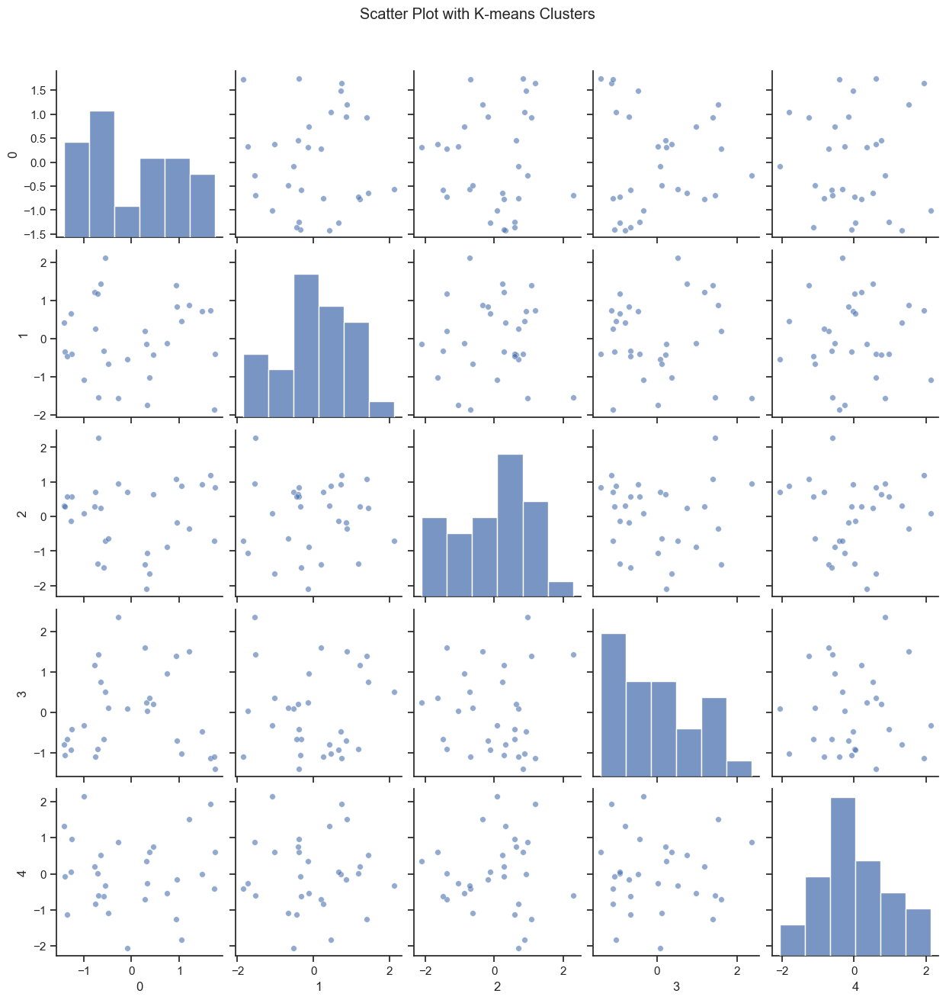

In [60]:
kmeans_clusters_2 = apply_kmeans_clustering(pca_result_2, ideal_n_clusters_2)

In [61]:
def apply_hierarchical_clustering(data, distance_threshold=None):
    """
    Apply Hierarchical Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        distance_threshold (float): The linkage distance threshold above which clusters will not be merged.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None)
    model.fit(data_scaled)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    dendrogram(linkage(data_scaled, method='ward'))
    plt.show()

    clusters = model.labels_

    print(f'Scatter Plot with Hierarchical Clusters (Number of Clusters: {len(np.unique(clusters))})')

    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.show()

    return clusters

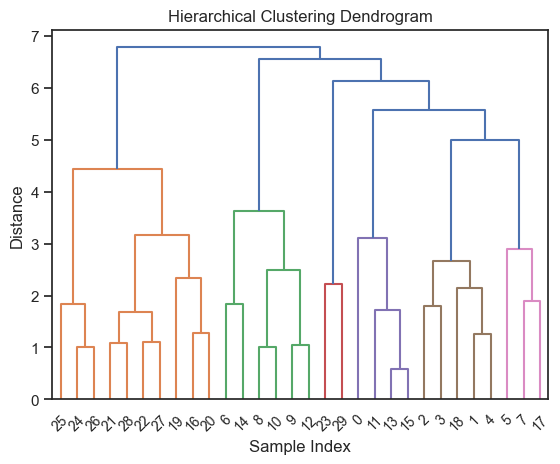

Scatter Plot with Hierarchical Clusters (Number of Clusters: 12)


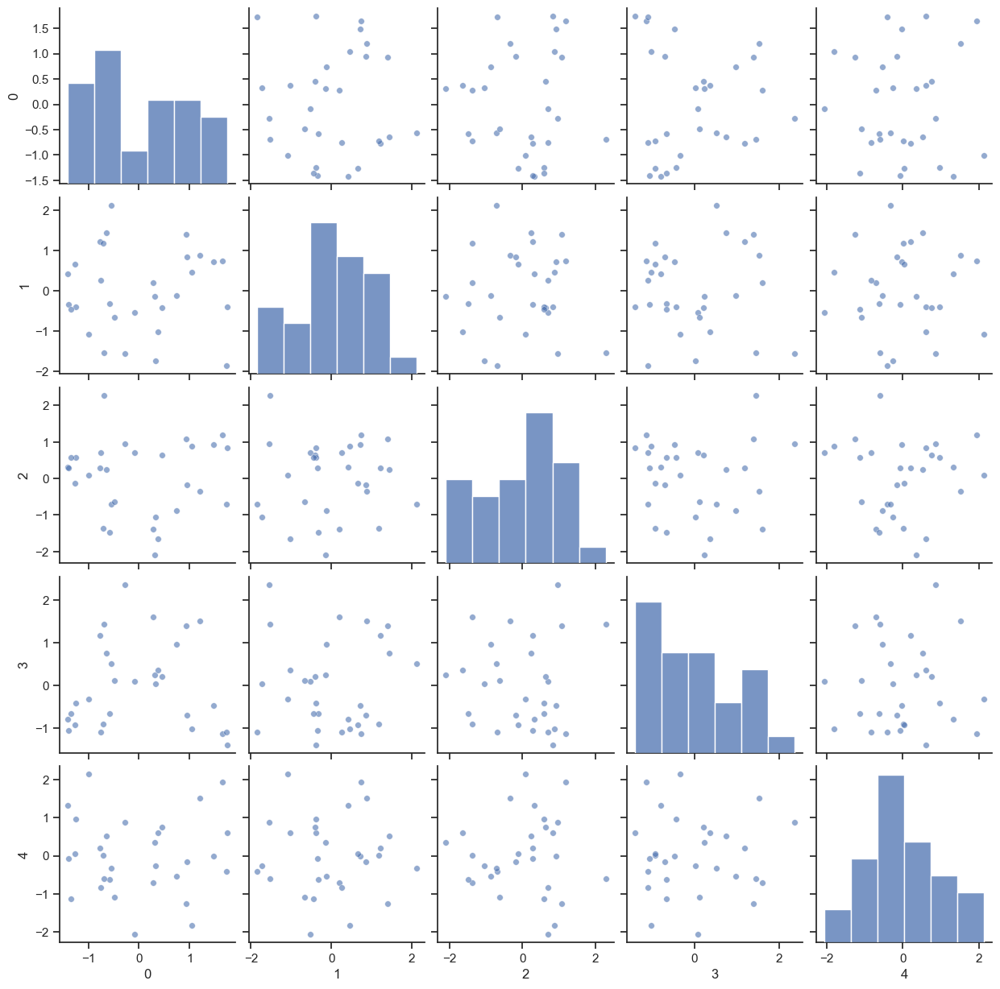

In [62]:
hierarchical_clusters_2 = apply_hierarchical_clustering(pca_result_2, distance_threshold=2.5)

In [63]:
def analyze_clusters(data, clusters):
    """
    Analyze the clusters by displaying cluster distribution and percentages.

    Args:
        data (pandas.DataFrame): Data with cluster labels.
        clusters (numpy.ndarray): Cluster labels.
    """
    data['Cluster'] = clusters

    cluster_counts = data['Cluster'].value_counts().sort_index()
    cluster_percentages = cluster_counts / cluster_counts.sum() * 100

    print("Cluster Distribution:")
    print(cluster_counts)
    print()
    print("Cluster Percentages:")
    print(cluster_percentages)

In [64]:
analyze_clusters(df2, kmeans_clusters_2)

Cluster Distribution:
Cluster
0    4
1    2
2    4
3    5
4    2
5    5
6    3
7    5
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    13.333333
1     6.666667
2    13.333333
3    16.666667
4     6.666667
5    16.666667
6    10.000000
7    16.666667
Name: count, dtype: float64


In [65]:
analyze_clusters(df2, hierarchical_clusters_2)

Cluster Distribution:
Cluster
0     4
1     3
2     3
3     2
4     3
5     2
6     3
7     2
8     4
9     1
10    1
11    2
Name: count, dtype: int64

Cluster Percentages:
Cluster
0     13.333333
1     10.000000
2     10.000000
3      6.666667
4     10.000000
5      6.666667
6     10.000000
7      6.666667
8     13.333333
9      3.333333
10     3.333333
11     6.666667
Name: count, dtype: float64


# Dataset - 4

In [66]:
file_path_3 = r'C:\Users\ashva\Work\christ\internship\Feynn Labs\Projects\Project 2\Codes\Code-2\EV-datasets\ev_charging_station_list.csv'
df3 = pd.read_csv(file_path_3)
df3

,no,region,address,aux addres,latitude,longitude,type,power,service
0,1,NDMC,"Prithviraj Market, Rabindra Nagar, New Delhi- ...","Electric Vehicle Charger, Prithviraj Market, R...",28.600725,77.226252,DC-001,15 kW,Self Service
1,2,NDMC,"Prithviraj Market, Rabindra Nagar, New Delhi- ...","Electric Vehicle Charger, Prithviraj Market, R...",28.600725,77.226252,DC-001,15 kW,Self Service
2,3,NDMC,"Outside RWA Park, Jor Bagh Market, Jor Bagh Co...","Electric Vehicle Charger, Outside RWA Park, Jo...",28.588303,77.217697,DC-001,15 kW,Self Service
3,4,NDMC,"Opposite Dory Pharmacy, Khanna Market, Aliganj...","Electric Vehicle Charger, Opposite Dory Pharma...",28.582654,77.220087,DC-001,15 kW,Self Service
4,5,NDMC,"Opposite Goel Opticals, Khanna Market, Aliganj...","Electric Vehicle Charger, Opposite Goel Optica...",28.584485,77.220316,DC-001,15 kW,Self Service
...,...,...,...,...,...,...,...,...,...
197,198,ANERT,"State Council For Child Welfare, CV Raman Pill...","Electric Vehicle Charger, State Council For Ch...",8.491622,76.956247,CCS/ChADEMO/ Type 2 AC,142kW,Self Service
198,199,ANERT,"Shanghumukham beach, thiruvananthapuram,Kerala...","Electric Vehicle Charger, Shanghumukham beach,...",8.481051,76.912622,DC-001,15 kW,Self Service
199,200,ANERT,"KTDC Tourist Reception Centre Shanmugham road,...","Electric Vehicle Charger, KTDC Tourist Recepti...",9.976921,76.277781,DC-001,15 kW,Self Service
200,201,ANERT,"State Council For Child Welfare, CV Raman Pill...","Electric Vehicle Charger, State Council For Ch...",8.491622,76.956247,DC-001,15 kW,Self Service


In [67]:
t=set()
for i in df3['type']:
    t.add(i)
t

{'AC-001', 'CCS/ChADEMO/ Type 2 AC', 'DC-001'}

In [68]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202 entries, 0 to 201
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   no          202 non-null    int64  
 1   region      202 non-null    object 
 2   address     202 non-null    object 
 3   aux addres  202 non-null    object 
 4   latitude    202 non-null    float64
 5   longitude   202 non-null    float64
 6   type        202 non-null    object 
 7   power       202 non-null    object 
 8   service     202 non-null    object 
dtypes: float64(2), int64(1), object(6)
memory usage: 14.3+ KB


In [69]:
pd.isnull(df3).sum()

no            0
region        0
address       0
aux addres    0
latitude      0
longitude     0
type          0
power         0
service       0
dtype: int64

In [70]:
df3.describe()

,no,latitude,longitude
count,202.000000,202.000000,202.000000
mean,101.500000,25.960987,78.418002
std,58.456537,5.616108,3.097664
min,1.000000,8.481051,76.277781
25%,51.250000,28.535516,77.212996
50%,101.500000,28.580286,77.226252
75%,151.750000,28.617783,77.375216
max,202.000000,28.642892,88.509064


In [71]:
def plot_type_count(data):
    """
    Plot the count of type in the data.

    Args:
        data (pandas.DataFrame): Data containing 'Gender' column.
    """
    t=[]

    for index in df3['type']:
        t.append(index)

    unique_list = list(set(t))

    sizes=[]
    for index in unique_list:
         sizes.append(data.query(f'type == "{index}"').type.count())

    plt.figure(figsize=(8, 8))
    my_circle = plt.Circle((0, 0), 0.7, color='white')

    plt.pie(
        sizes,
        labels=unique_list,
        autopct='%1.1f%%',
        pctdistance=0.85
    )

    p = plt.gcf()
    plt.axis('equal')
    p.gca().add_artist(my_circle)

    plt.show()

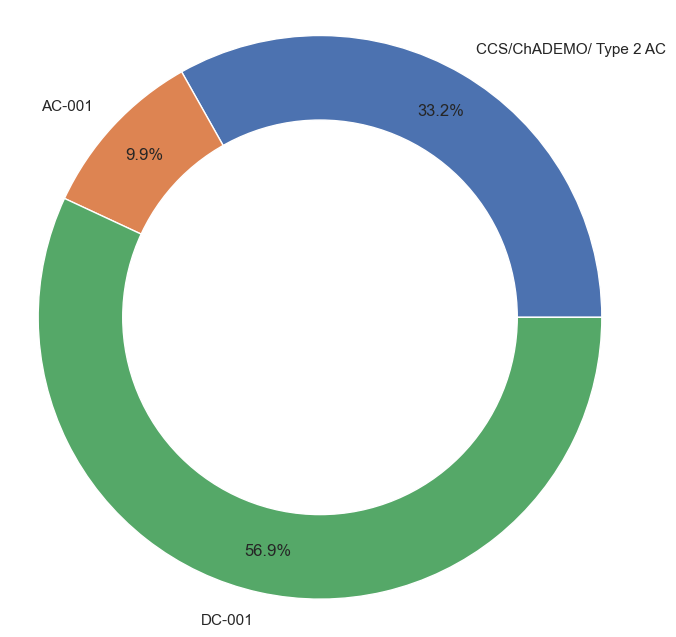

In [72]:
plot_type_count(df3)

In [73]:
def plot_region_count(d):
    """
    Plot the count of region using Seaborn.

    Args:
        d (pandas.DataFrame): Data containing 'Brand' column.
    """
    plt.figure(figsize=(30, 20))
    sns.countplot(data=d, x='region')

    # Set labels and title
    plt.xlabel('region')
    plt.ylabel('Count')
    plt.title('Count of region')

    # Display the plot
    plt.show()

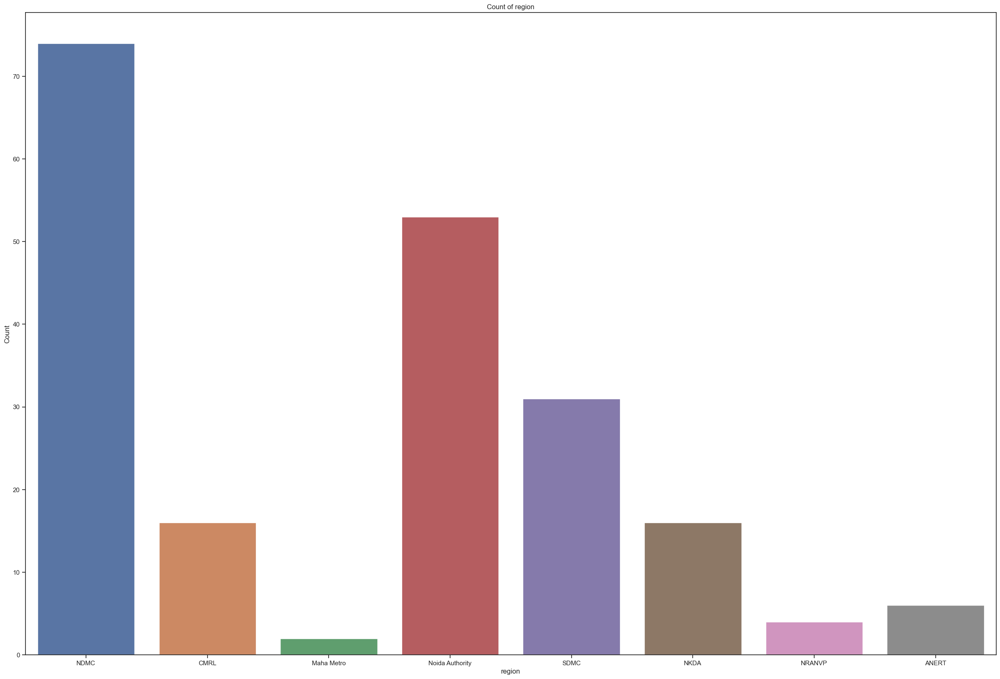

In [74]:
plot_region_count(df3)

In [75]:
def preprocess_data(data):
    """
    Preprocess the data by converting columns to their respective representations.

    Args:
        data (pandas.DataFrame): Input data.

    Returns:
        pandas.DataFrame: Preprocessed data.
    """
    processed_data = data.copy()
    categorical_columns = processed_data.select_dtypes(include='object').columns
    numeric_columns = processed_data.select_dtypes(include=['int', 'float']).columns

    # Convert categorical columns
    processed_data[categorical_columns] = processed_data[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

    # Scale numeric columns
    scaler = StandardScaler()
    processed_data[numeric_columns] = scaler.fit_transform(processed_data[numeric_columns])

    return processed_data

In [76]:
preprocessed_data_3 = preprocess_data(df3)

In [77]:
def perform_pca(data):
    """
    Perform Principal Component Analysis (PCA) on the data.

    Args:
        data (pandas.DataFrame): Data to perform PCA on.

    Returns:
        numpy.ndarray: Resulting PCA components.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    pca = PCA()
    pca_res = pca.fit_transform(data_scaled)

    for iteration in range(pca.n_components_):
        print(f"PC{iteration + 1}")
        print(f"Standard deviation: {np.round(np.sqrt(pca.explained_variance_[iteration]), 4)}")
        print(f"Proportion of Variance: {np.round(pca.explained_variance_ratio_[iteration], 4)}")
        print(f"Cumulative Proportion: {np.round(np.sum(pca.explained_variance_ratio_[:iteration+1]), 4)}")
        print()

    return pca_res

In [78]:
pca_result_3 = perform_pca(preprocessed_data_3)

PC1
Standard deviation: 1.5974
Proportion of Variance: 0.3174
Cumulative Proportion: 0.3174

PC2
Standard deviation: 1.4371
Proportion of Variance: 0.2569
Cumulative Proportion: 0.5742

PC3
Standard deviation: 1.1626
Proportion of Variance: 0.1681
Cumulative Proportion: 0.7423

PC4
Standard deviation: 0.9298
Proportion of Variance: 0.1075
Cumulative Proportion: 0.8499

PC5
Standard deviation: 0.8774
Proportion of Variance: 0.0958
Cumulative Proportion: 0.9456

PC6
Standard deviation: 0.4768
Proportion of Variance: 0.0283
Cumulative Proportion: 0.9739

PC7
Standard deviation: 0.4581
Proportion of Variance: 0.0261
Cumulative Proportion: 1.0

PC8
Standard deviation: 0.0
Proportion of Variance: 0.0
Cumulative Proportion: 1.0

PC9
Standard deviation: 0.0
Proportion of Variance: 0.0
Cumulative Proportion: 1.0



In [79]:
def find_optimal_clusters(data, max_clusters=10, n_init=10):
    """
    Find the optimal number of clusters using the elbow method.

    Args:
        data (numpy.ndarray): Data to cluster.
        max_clusters (int): Maximum number of clusters to consider.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        int: Optimal number of clusters.
    """
    if max(abs(data.mean()), abs(data.std())) > 1e-8:
        scaler = StandardScaler()
        data = scaler.fit_transform(data)

    wcss = []
    for num_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=n_init)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # Calculate the optimal number of clusters
    differences = np.diff(wcss)
    avg_differences = differences[1:] / differences[:-1]

    optimal_clusters = np.argmax(avg_differences) + 1

    # Plot the WCSS values
    plt.plot(range(1, max_clusters + 1), wcss)
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    return optimal_clusters

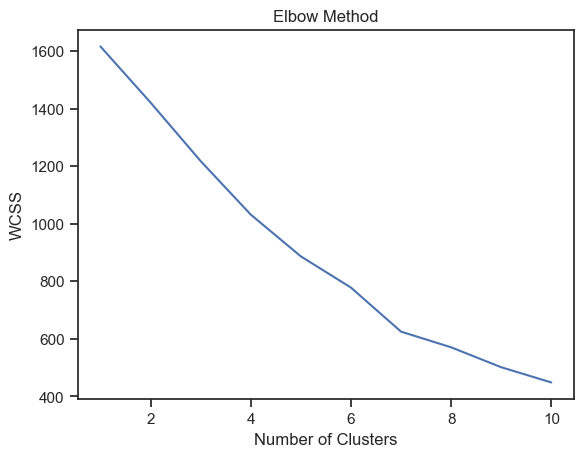

In [80]:
ideal_n_clusters_3 = find_optimal_clusters(pca_result_3)

In [81]:
ideal_n_clusters_3

5

In [82]:
def apply_kmeans_clustering(data, n_clusters, n_init=10):
    """
    Apply K-means Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        n_clusters (int): Number of clusters.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_init)
    clusters = kmeans.fit_predict(data_scaled)

    sns.set(style="ticks")
    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.suptitle('Scatter Plot with K-means Clusters', y=1.05)
    plt.show()

    return clusters

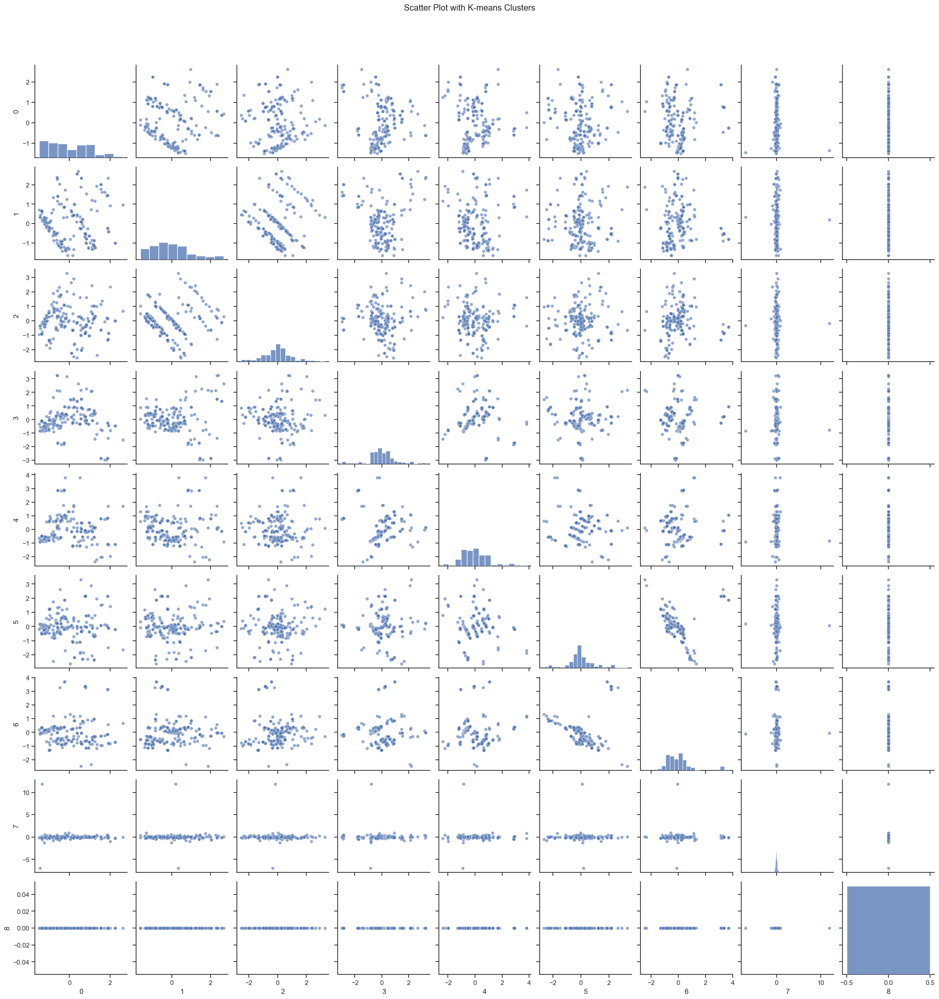

In [83]:
kmeans_clusters_3 = apply_kmeans_clustering(pca_result_3, ideal_n_clusters_3)

In [84]:
def apply_hierarchical_clustering(data, distance_threshold=None):
    """
    Apply Hierarchical Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        distance_threshold (float): The linkage distance threshold above which clusters will not be merged.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None)
    model.fit(data_scaled)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    dendrogram(linkage(data_scaled, method='ward'))
    plt.show()

    clusters = model.labels_

    print(f'Scatter Plot with Hierarchical Clusters (Number of Clusters: {len(np.unique(clusters))})')

    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.show()

    return clusters

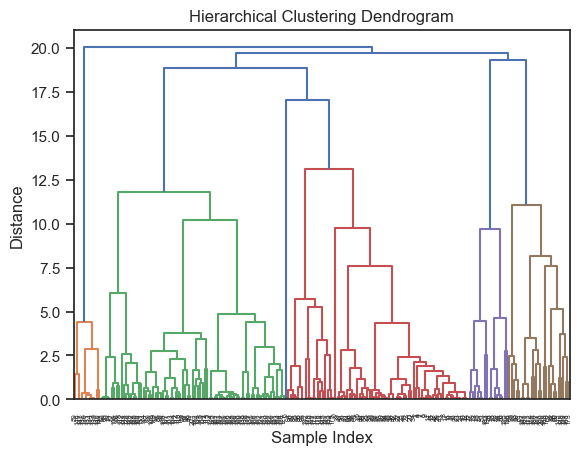

Scatter Plot with Hierarchical Clusters (Number of Clusters: 38)


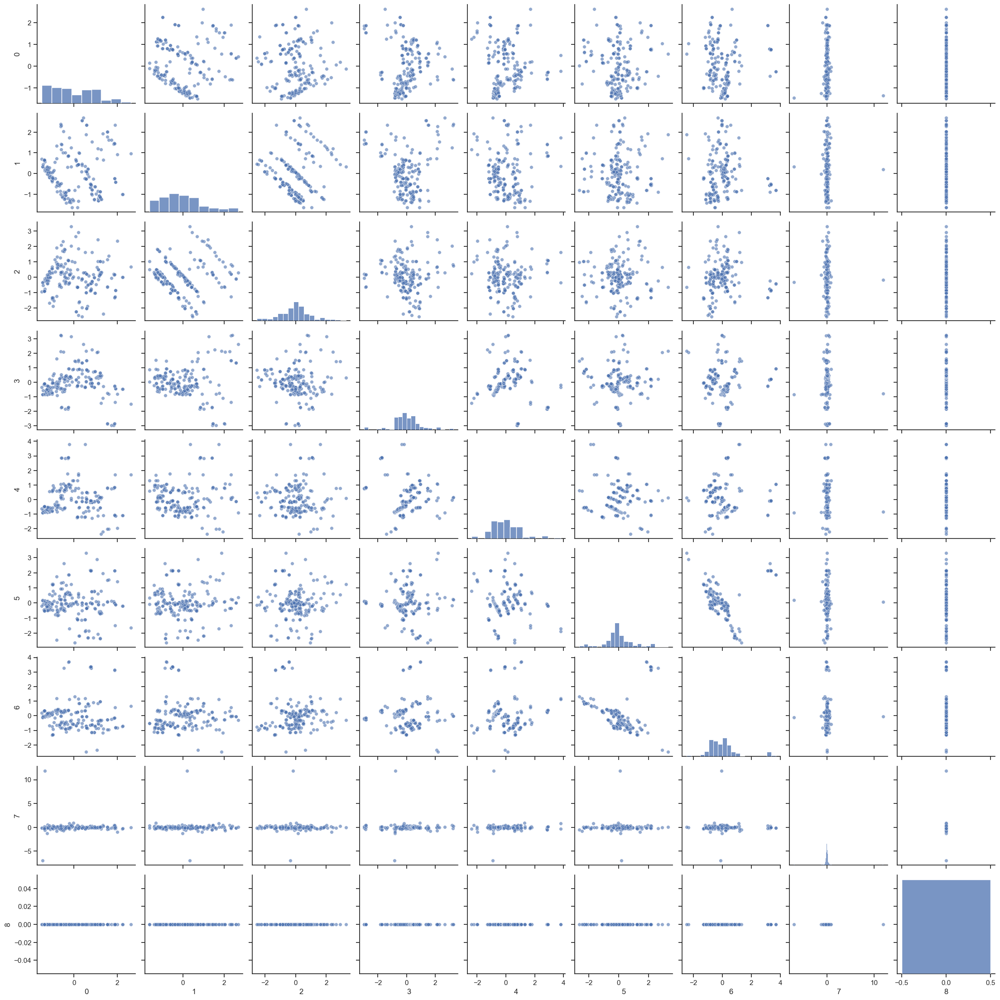

In [85]:
hierarchical_clusters_3 = apply_hierarchical_clustering(pca_result_3, distance_threshold=2.5)

In [86]:
def analyze_clusters(data, clusters):
    """
    Analyze the clusters by displaying cluster distribution and percentages.

    Args:
        data (pandas.DataFrame): Data with cluster labels.
        clusters (numpy.ndarray): Cluster labels.
    """
    data['Cluster'] = clusters

    cluster_counts = data['Cluster'].value_counts().sort_index()
    cluster_percentages = cluster_counts / cluster_counts.sum() * 100

    print("Cluster Distribution:")
    print(cluster_counts)
    print()
    print("Cluster Percentages:")
    print(cluster_percentages)

In [87]:
analyze_clusters(df3, kmeans_clusters_3)

Cluster Distribution:
Cluster
0    77
1    97
2    11
3     1
4    16
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    38.118812
1    48.019802
2     5.445545
3     0.495050
4     7.920792
Name: count, dtype: float64


In [88]:
analyze_clusters(df3, hierarchical_clusters_3)

Cluster Distribution:
Cluster
0      2
1      5
2      3
3     33
4     10
5      3
6     12
7      8
8      3
9      6
10     6
11     3
12    10
13     5
14     2
15     8
16     7
17     2
18     4
19    13
20     2
21     1
22     4
23     1
24     7
25     1
26     2
27     4
28     3
29     5
30     4
31     6
32     2
33     4
34     8
35     1
36     1
37     1
Name: count, dtype: int64

Cluster Percentages:
Cluster
0      0.990099
1      2.475248
2      1.485149
3     16.336634
4      4.950495
5      1.485149
6      5.940594
7      3.960396
8      1.485149
9      2.970297
10     2.970297
11     1.485149
12     4.950495
13     2.475248
14     0.990099
15     3.960396
16     3.465347
17     0.990099
18     1.980198
19     6.435644
20     0.990099
21     0.495050
22     1.980198
23     0.495050
24     3.465347
25     0.495050
26     0.990099
27     1.980198
28     1.485149
29     2.475248
30     1.980198
31     2.970297
32     0.990099
33     1.980198
34     3.960396
35     0.495

# Dataset - 5

In [89]:
file_path_4 = r'C:\Users\ashva\Work\christ\internship\Feynn Labs\Projects\Project 2\Codes\Code-2\EV-datasets\General_vehicle_data.csv'
df4 = pd.read_csv(file_path_4)
df4

,Car_Name,Year,Selling_Price,Present_Price,Kms_Driven,Fuel_Type,Seller_Type,Transmission,Owner
0,ritz,2014,3.35,5.59,27000,Petrol,Dealer,Manual,0
1,sx4,2013,4.75,9.54,43000,Diesel,Dealer,Manual,0
2,ciaz,2017,7.25,9.85,6900,Petrol,Dealer,Manual,0
3,wagon r,2011,2.85,4.15,5200,Petrol,Dealer,Manual,0
4,swift,2014,4.60,6.87,42450,Diesel,Dealer,Manual,0
...,...,...,...,...,...,...,...,...,...
296,city,2016,9.50,11.60,33988,Diesel,Dealer,Manual,0
297,brio,2015,4.00,5.90,60000,Petrol,Dealer,Manual,0
298,city,2009,3.35,11.00,87934,Petrol,Dealer,Manual,0
299,city,2017,11.50,12.50,9000,Diesel,Dealer,Manual,0


In [90]:
t=set()
for i in df4['Car_Name']:
    t.add(i)
t

{'800',
 'Activa 3g',
 'Activa 4g',
 'Bajaj  ct 100',
 'Bajaj Avenger 150',
 'Bajaj Avenger 150 street',
 'Bajaj Avenger 220',
 'Bajaj Avenger 220 dtsi',
 'Bajaj Avenger Street 220',
 'Bajaj Discover 100',
 'Bajaj Discover 125',
 'Bajaj Dominar 400',
 'Bajaj Pulsar  NS 200',
 'Bajaj Pulsar 135 LS',
 'Bajaj Pulsar 150',
 'Bajaj Pulsar 220 F',
 'Bajaj Pulsar NS 200',
 'Bajaj Pulsar RS200',
 'Hero  CBZ Xtreme',
 'Hero  Ignitor Disc',
 'Hero Extreme',
 'Hero Glamour',
 'Hero Honda CBZ extreme',
 'Hero Honda Passion Pro',
 'Hero Hunk',
 'Hero Passion Pro',
 'Hero Passion X pro',
 'Hero Splender Plus',
 'Hero Splender iSmart',
 'Hero Super Splendor',
 'Honda Activa 125',
 'Honda Activa 4G',
 'Honda CB Hornet 160R',
 'Honda CB Shine',
 'Honda CB Trigger',
 'Honda CB Unicorn',
 'Honda CB twister',
 'Honda CBR 150',
 'Honda Dream Yuga ',
 'Honda Karizma',
 'Hyosung GT250R',
 'KTM 390 Duke ',
 'KTM RC200',
 'KTM RC390',
 'Mahindra Mojo XT300',
 'Royal Enfield Bullet 350',
 'Royal Enfield Classic

In [91]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301 entries, 0 to 300
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Car_Name       301 non-null    object 
 1   Year           301 non-null    int64  
 2   Selling_Price  301 non-null    float64
 3   Present_Price  301 non-null    float64
 4   Kms_Driven     301 non-null    int64  
 5   Fuel_Type      301 non-null    object 
 6   Seller_Type    301 non-null    object 
 7   Transmission   301 non-null    object 
 8   Owner          301 non-null    int64  
dtypes: float64(2), int64(3), object(4)
memory usage: 21.3+ KB


In [92]:
pd.isnull(df4).sum()

Car_Name         0
Year             0
Selling_Price    0
Present_Price    0
Kms_Driven       0
Fuel_Type        0
Seller_Type      0
Transmission     0
Owner            0
dtype: int64

In [93]:
df4.describe()

,Year,Selling_Price,Present_Price,Kms_Driven,Owner
count,301.000000,301.000000,301.000000,301.000000,301.000000
mean,2013.627907,4.661296,7.628472,36947.205980,0.043189
std,2.891554,5.082812,8.644115,38886.883882,0.247915
min,2003.000000,0.100000,0.320000,500.000000,0.000000
25%,2012.000000,0.900000,1.200000,15000.000000,0.000000
50%,2014.000000,3.600000,6.400000,32000.000000,0.000000
75%,2016.000000,6.000000,9.900000,48767.000000,0.000000
max,2018.000000,35.000000,92.600000,500000.000000,3.000000


In [96]:
def plot_Fuel_Type_count(data):
    """
    Plot the count of Fuel_Type in the data.

    Args:
        data (pandas.DataFrame): Data containing 'Gender' column.
    """
    t=[]

    for index in df4['Fuel_Type']:
        t.append(index)

    unique_list = list(set(t))

    sizes=[]
    for index in unique_list:
         sizes.append(data.query(f'Fuel_Type == "{index}"').Fuel_Type.count())

    plt.figure(figsize=(8, 8))
    my_circle = plt.Circle((0, 0), 0.7, color='white')

    plt.pie(
        sizes,
        labels=unique_list,
        autopct='%1.1f%%',
        pctdistance=0.85
    )

    p = plt.gcf()
    plt.axis('equal')
    p.gca().add_artist(my_circle)

    plt.show()

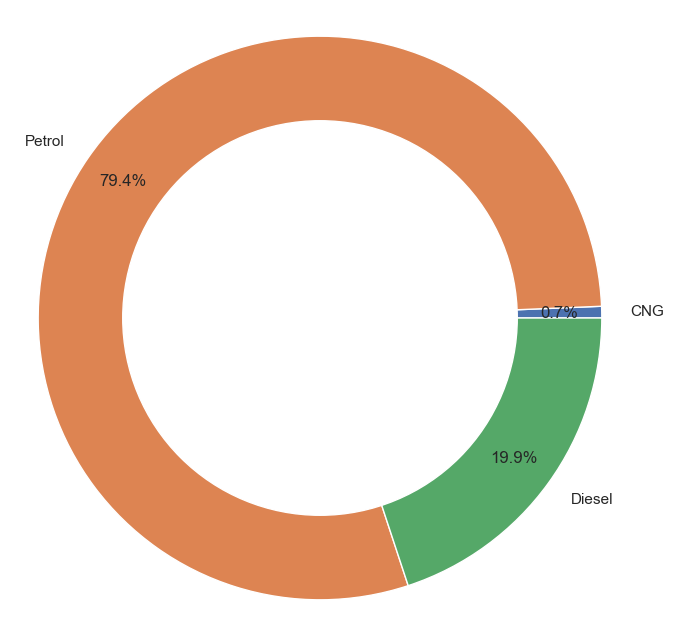

In [97]:
plot_Fuel_Type_count(df4)

In [98]:
def plot_Transmission_count(data):
    """
    Plot the count of Transmission in the data.

    Args:
        data (pandas.DataFrame): Data containing 'Gender' column.
    """
    t=[]

    for index in df4['Transmission']:
        t.append(index)

    unique_list = list(set(t))

    sizes=[]
    for index in unique_list:
         sizes.append(data.query(f'Transmission == "{index}"').Transmission.count())

    plt.figure(figsize=(8, 8))
    my_circle = plt.Circle((0, 0), 0.7, color='white')

    plt.pie(
        sizes,
        labels=unique_list,
        autopct='%1.1f%%',
        pctdistance=0.85
    )

    p = plt.gcf()
    plt.axis('equal')
    p.gca().add_artist(my_circle)

    plt.show()

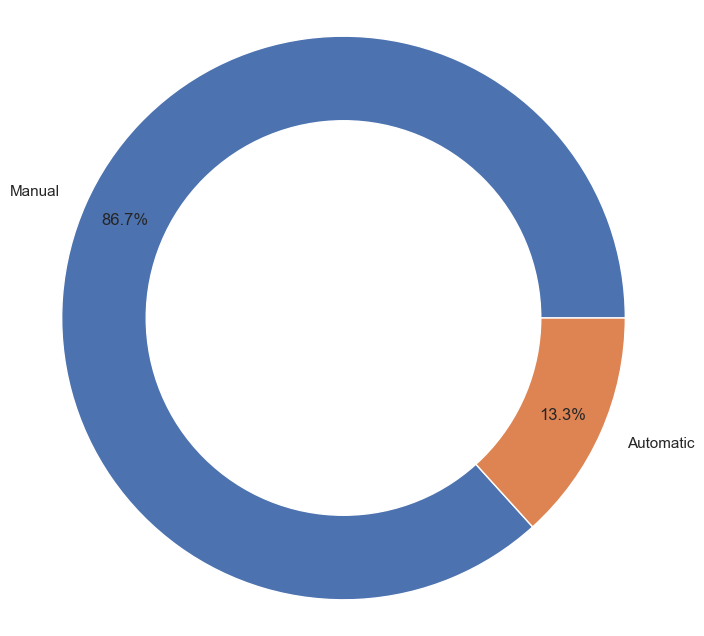

In [99]:
plot_Transmission_count(df4)

In [104]:
def preprocess_data(data):
    """
    Preprocess the data by converting columns to their respective representations.

    Args:
        data (pandas.DataFrame): Input data.

    Returns:
        pandas.DataFrame: Preprocessed data.
    """
    processed_data = data.copy()
    categorical_columns = processed_data.select_dtypes(include='object').columns
    numeric_columns = processed_data.select_dtypes(include=['int', 'float']).columns

    # Convert categorical columns
    processed_data[categorical_columns] = processed_data[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

    # Scale numeric columns
    scaler = StandardScaler()
    processed_data[numeric_columns] = scaler.fit_transform(processed_data[numeric_columns])

    return processed_data

In [105]:
preprocessed_data_4 = preprocess_data(df4)

In [106]:
def perform_pca(data):
    """
    Perform Principal Component Analysis (PCA) on the data.

    Args:
        data (pandas.DataFrame): Data to perform PCA on.

    Returns:
        numpy.ndarray: Resulting PCA components.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    pca = PCA()
    pca_res = pca.fit_transform(data_scaled)

    for iteration in range(pca.n_components_):
        print(f"PC{iteration + 1}")
        print(f"Standard deviation: {np.round(np.sqrt(pca.explained_variance_[iteration]), 4)}")
        print(f"Proportion of Variance: {np.round(pca.explained_variance_ratio_[iteration], 4)}")
        print(f"Cumulative Proportion: {np.round(np.sum(pca.explained_variance_ratio_[:iteration+1]), 4)}")
        print()

    return pca_res

In [107]:
pca_result_4 = perform_pca(preprocessed_data_4)

PC1
Standard deviation: 1.8249
Proportion of Variance: 0.3688
Cumulative Proportion: 0.3688

PC2
Standard deviation: 1.2855
Proportion of Variance: 0.183
Cumulative Proportion: 0.5518

PC3
Standard deviation: 1.087
Proportion of Variance: 0.1309
Cumulative Proportion: 0.6827

PC4
Standard deviation: 0.9578
Proportion of Variance: 0.1016
Cumulative Proportion: 0.7843

PC5
Standard deviation: 0.8813
Proportion of Variance: 0.086
Cumulative Proportion: 0.8703

PC6
Standard deviation: 0.7229
Proportion of Variance: 0.0579
Cumulative Proportion: 0.9282

PC7
Standard deviation: 0.6447
Proportion of Variance: 0.046
Cumulative Proportion: 0.9742

PC8
Standard deviation: 0.4041
Proportion of Variance: 0.0181
Cumulative Proportion: 0.9923

PC9
Standard deviation: 0.2642
Proportion of Variance: 0.0077
Cumulative Proportion: 1.0



In [108]:
def find_optimal_clusters(data, max_clusters=10, n_init=10):
    """
    Find the optimal number of clusters using the elbow method.

    Args:
        data (numpy.ndarray): Data to cluster.
        max_clusters (int): Maximum number of clusters to consider.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        int: Optimal number of clusters.
    """
    if max(abs(data.mean()), abs(data.std())) > 1e-8:
        scaler = StandardScaler()
        data = scaler.fit_transform(data)

    wcss = []
    for num_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=n_init)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # Calculate the optimal number of clusters
    differences = np.diff(wcss)
    avg_differences = differences[1:] / differences[:-1]

    optimal_clusters = np.argmax(avg_differences) + 1

    # Plot the WCSS values
    plt.plot(range(1, max_clusters + 1), wcss)
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    return optimal_clusters

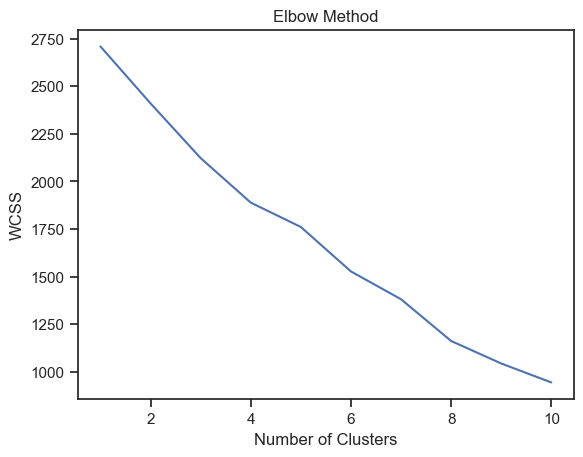

In [109]:
ideal_n_clusters_4 = find_optimal_clusters(pca_result_4)

In [110]:
ideal_n_clusters_4

4

In [111]:
def apply_kmeans_clustering(data, n_clusters, n_init=10):
    """
    Apply K-means Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        n_clusters (int): Number of clusters.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_init)
    clusters = kmeans.fit_predict(data_scaled)

    sns.set(style="ticks")
    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.suptitle('Scatter Plot with K-means Clusters', y=1.05)
    plt.show()

    return clusters

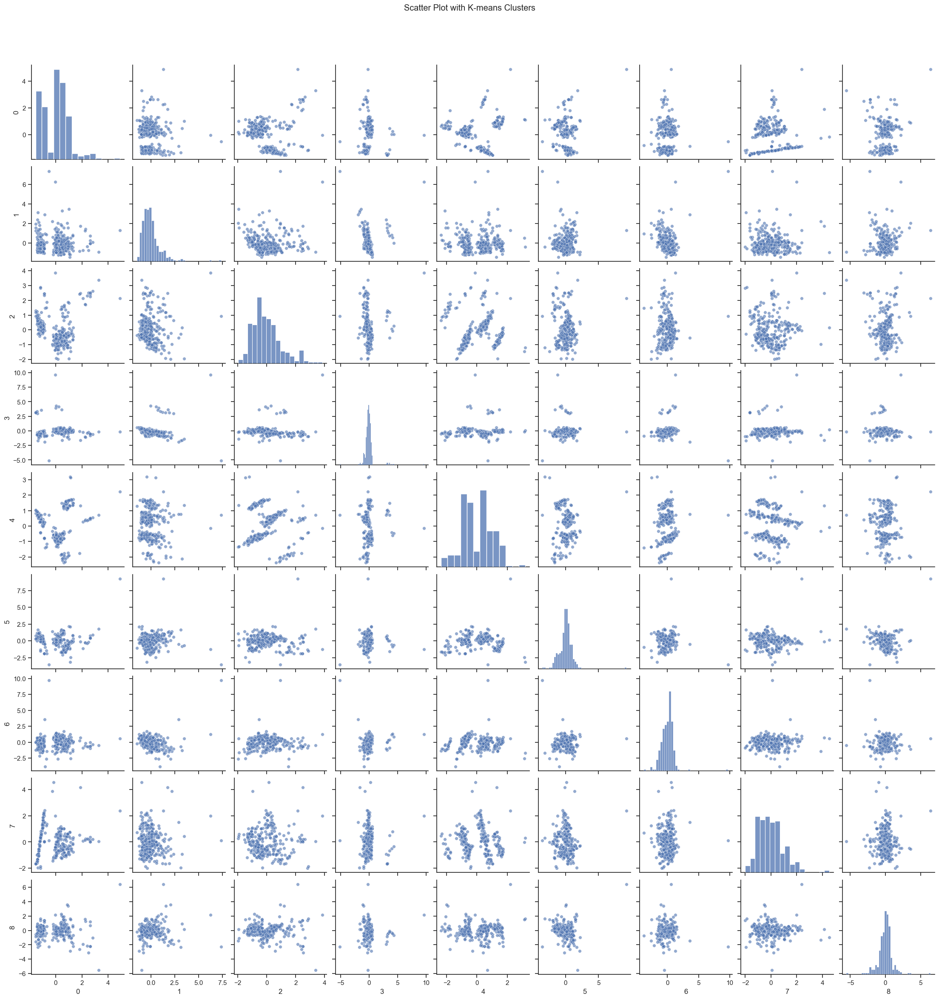

In [112]:
kmeans_clusters_4 = apply_kmeans_clustering(pca_result_4, ideal_n_clusters_4)

In [113]:
def apply_hierarchical_clustering(data, distance_threshold=None):
    """
    Apply Hierarchical Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        distance_threshold (float): The linkage distance threshold above which clusters will not be merged.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None)
    model.fit(data_scaled)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    dendrogram(linkage(data_scaled, method='ward'))
    plt.show()

    clusters = model.labels_

    print(f'Scatter Plot with Hierarchical Clusters (Number of Clusters: {len(np.unique(clusters))})')

    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.show()

    return clusters

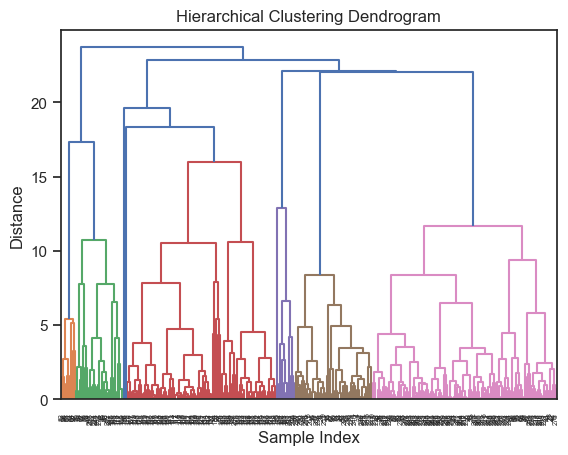

Scatter Plot with Hierarchical Clusters (Number of Clusters: 62)


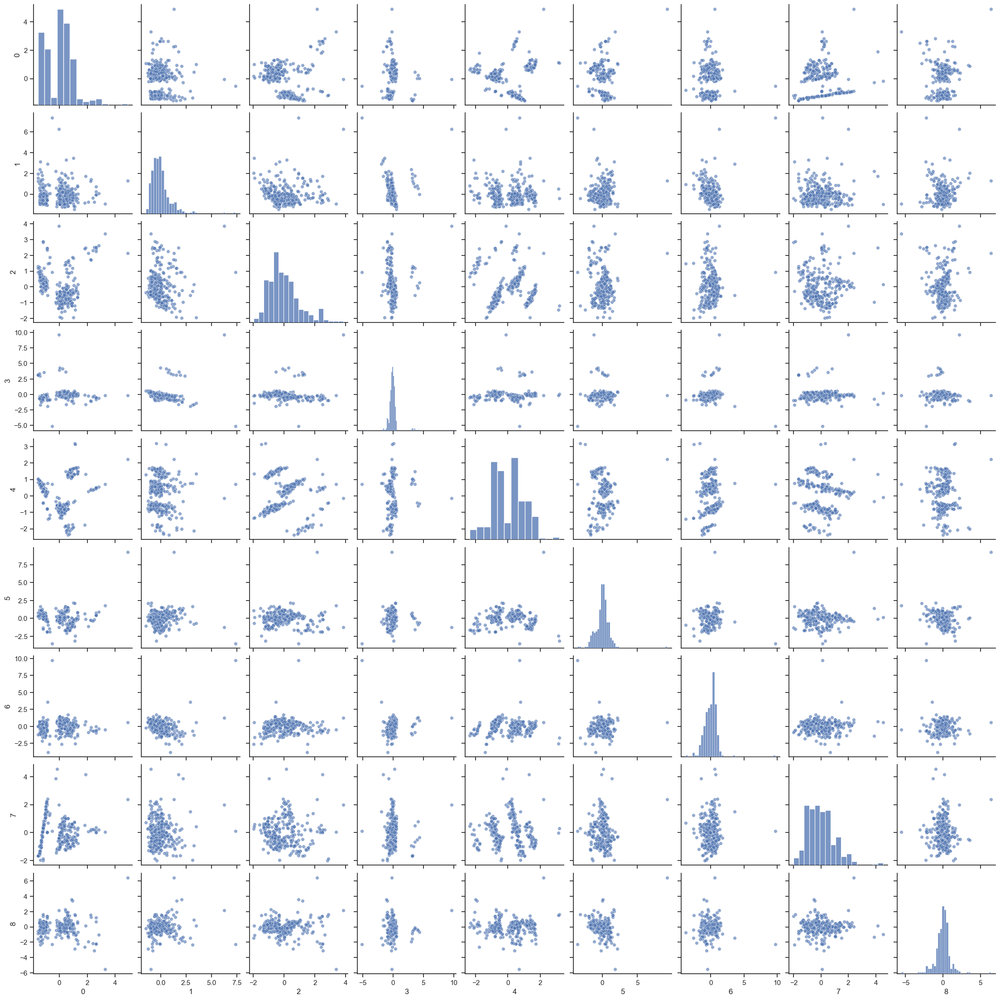

In [114]:
hierarchical_clusters_4 = apply_hierarchical_clustering(pca_result_4, distance_threshold=2.5)

In [115]:
def analyze_clusters(data, clusters):
    """
    Analyze the clusters by displaying cluster distribution and percentages.

    Args:
        data (pandas.DataFrame): Data with cluster labels.
        clusters (numpy.ndarray): Cluster labels.
    """
    data['Cluster'] = clusters

    cluster_counts = data['Cluster'].value_counts().sort_index()
    cluster_percentages = cluster_counts / cluster_counts.sum() * 100

    print("Cluster Distribution:")
    print(cluster_counts)
    print()
    print("Cluster Percentages:")
    print(cluster_percentages)

In [116]:
analyze_clusters(df4, kmeans_clusters_4)

Cluster Distribution:
Cluster
0     98
1    116
2     49
3     38
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    32.558140
1    38.538206
2    16.279070
3    12.624585
Name: count, dtype: float64


In [117]:
analyze_clusters(df4, hierarchical_clusters_4)

Cluster Distribution:
Cluster
0     16
1      4
2      4
3     10
4     12
      ..
57     1
58     1
59     8
60     2
61     2
Name: count, Length: 62, dtype: int64

Cluster Percentages:
Cluster
0     5.315615
1     1.328904
2     1.328904
3     3.322259
4     3.986711
        ...   
57    0.332226
58    0.332226
59    2.657807
60    0.664452
61    0.664452
Name: count, Length: 62, dtype: float64


# Dataset - 6

In [118]:
file_path_4 = r'C:\Users\ashva\Work\christ\internship\Feynn Labs\Projects\Project 2\Codes\Code-2\EV-datasets\charging_station_data.xlsx'
df5 = pd.read_excel(file_path_4)
df5

,State/ Uts,No. of charging stations
0,Maharashtra,317
1,Andhra Pradesh,266
2,Tamil Nadu,281
3,Gujarat,278
4,Uttar Pradesh,207
5,Rajasthan,205
6,Karnataka,172
7,Madhya Pradesh,235
8,West Bengal,141
9,Telangana,138


In [119]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   State/ Uts                25 non-null     object
 1   No. of charging stations  25 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 532.0+ bytes


In [120]:
pd.isnull(df5).sum()

State/ Uts                  0
No. of charging stations    0
dtype: int64

In [121]:
df5.describe()

,No. of charging stations
count,25.000000
mean,115.080000
std,105.731941
min,10.000000
25%,25.000000
50%,70.000000
75%,207.000000
max,317.000000


In [122]:
def plot_charging_stations_count(d):
    """
    Plot the count of Charging Stations using Seaborn.

    Args:
        d (pandas.DataFrame): Data containing 'Brand' column.
    """
    plt.figure(figsize=(35, 20))
    sns.barplot(data=d, x='State/ Uts',y='No. of charging stations')

    # Set labels and title
    plt.xlabel('State/ Uts')
    plt.ylabel('Charging Stations')
    plt.title('No. of charging stations')

    # Display the plot
    plt.show()

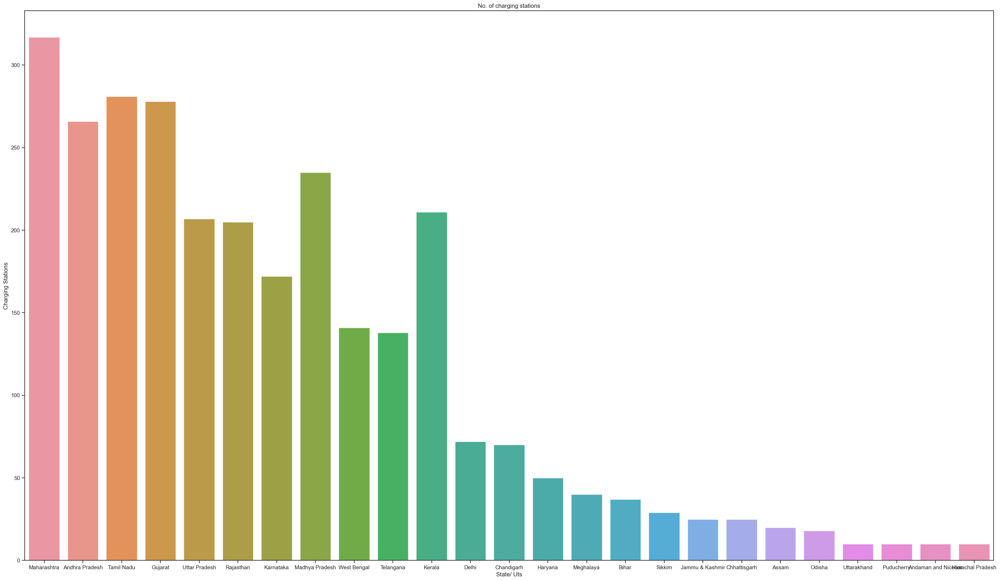

In [123]:
plot_charging_stations_count(df5)

In [124]:
def preprocess_data(data):
    """
    Preprocess the data by converting columns to their respective representations.

    Args:
        data (pandas.DataFrame): Input data.

    Returns:
        pandas.DataFrame: Preprocessed data.
    """
    processed_data = data.copy()
    categorical_columns = processed_data.select_dtypes(include='object').columns
    numeric_columns = processed_data.select_dtypes(include=['int', 'float']).columns

    # Convert categorical columns
    processed_data[categorical_columns] = processed_data[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

    # Scale numeric columns
    scaler = StandardScaler()
    processed_data[numeric_columns] = scaler.fit_transform(processed_data[numeric_columns])

    return processed_data

In [125]:
preprocessed_data_5 = preprocess_data(df5)

In [126]:
def perform_pca(data):
    """
    Perform Principal Component Analysis (PCA) on the data.

    Args:
        data (pandas.DataFrame): Data to perform PCA on.

    Returns:
        numpy.ndarray: Resulting PCA components.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    pca = PCA()
    pca_res = pca.fit_transform(data_scaled)

    for iteration in range(pca.n_components_):
        print(f"PC{iteration + 1}")
        print(f"Standard deviation: {np.round(np.sqrt(pca.explained_variance_[iteration]), 4)}")
        print(f"Proportion of Variance: {np.round(pca.explained_variance_ratio_[iteration], 4)}")
        print(f"Cumulative Proportion: {np.round(np.sum(pca.explained_variance_ratio_[:iteration+1]), 4)}")
        print()

    return pca_res

In [127]:
pca_result_5 = perform_pca(preprocessed_data_5)

PC1
Standard deviation: 1.1076
Proportion of Variance: 0.5888
Cumulative Proportion: 0.5888

PC2
Standard deviation: 0.9255
Proportion of Variance: 0.4112
Cumulative Proportion: 1.0



In [128]:
def find_optimal_clusters(data, max_clusters=10, n_init=10):
    """
    Find the optimal number of clusters using the elbow method.

    Args:
        data (numpy.ndarray): Data to cluster.
        max_clusters (int): Maximum number of clusters to consider.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        int: Optimal number of clusters.
    """
    if max(abs(data.mean()), abs(data.std())) > 1e-8:
        scaler = StandardScaler()
        data = scaler.fit_transform(data)

    wcss = []
    for num_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=n_init)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # Calculate the optimal number of clusters
    differences = np.diff(wcss)
    avg_differences = differences[1:] / differences[:-1]

    optimal_clusters = np.argmax(avg_differences) + 1

    # Plot the WCSS values
    plt.plot(range(1, max_clusters + 1), wcss)
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    return optimal_clusters

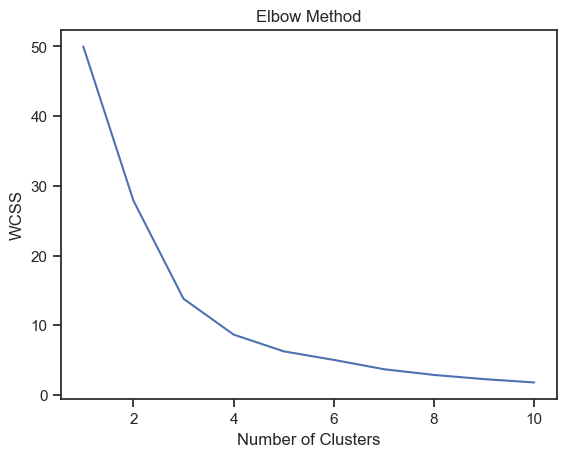

In [129]:
ideal_n_clusters_5 = find_optimal_clusters(pca_result_5)

In [130]:
ideal_n_clusters_5

5

In [131]:
def apply_kmeans_clustering(data, n_clusters, n_init=10):
    """
    Apply K-means Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        n_clusters (int): Number of clusters.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_init)
    clusters = kmeans.fit_predict(data_scaled)

    sns.set(style="ticks")
    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.suptitle('Scatter Plot with K-means Clusters', y=1.05)
    plt.show()

    return clusters

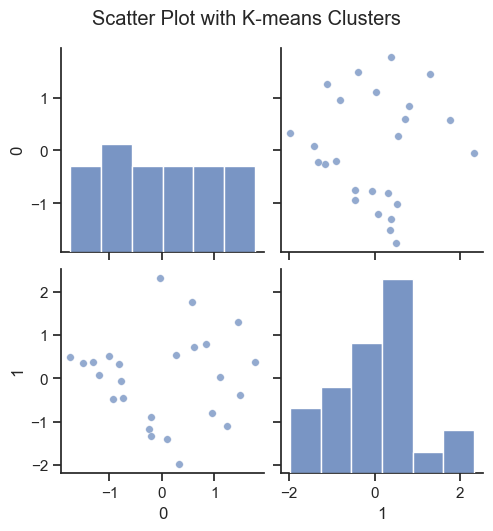

In [132]:
kmeans_clusters_5 = apply_kmeans_clustering(pca_result_5, ideal_n_clusters_5)

In [133]:
def apply_hierarchical_clustering(data, distance_threshold=None):
    """
    Apply Hierarchical Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        distance_threshold (float): The linkage distance threshold above which clusters will not be merged.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None)
    model.fit(data_scaled)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    dendrogram(linkage(data_scaled, method='ward'))
    plt.show()

    clusters = model.labels_

    print(f'Scatter Plot with Hierarchical Clusters (Number of Clusters: {len(np.unique(clusters))})')

    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.show()

    return clusters

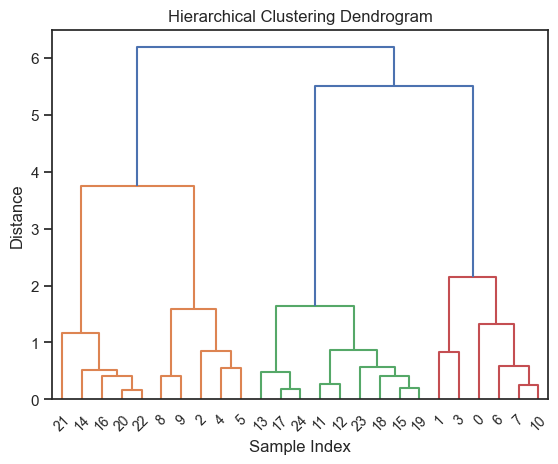

Scatter Plot with Hierarchical Clusters (Number of Clusters: 4)


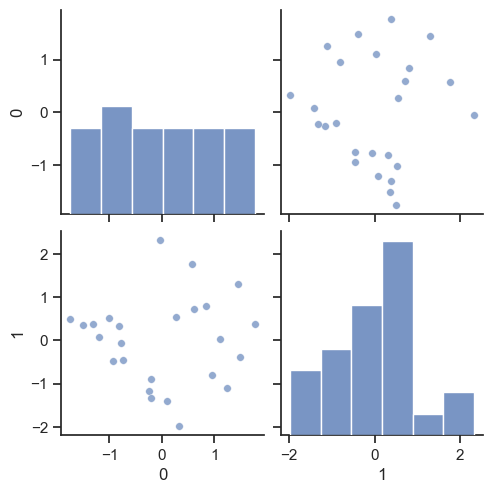

In [134]:
hierarchical_clusters_5 = apply_hierarchical_clustering(pca_result_5, distance_threshold=2.5)

In [135]:
def analyze_clusters(data, clusters):
    """
    Analyze the clusters by displaying cluster distribution and percentages.

    Args:
        data (pandas.DataFrame): Data with cluster labels.
        clusters (numpy.ndarray): Cluster labels.
    """
    data['Cluster'] = clusters

    cluster_counts = data['Cluster'].value_counts().sort_index()
    cluster_percentages = cluster_counts / cluster_counts.sum() * 100

    print("Cluster Distribution:")
    print(cluster_counts)
    print()
    print("Cluster Percentages:")
    print(cluster_percentages)

In [136]:
analyze_clusters(df5, kmeans_clusters_5)

Cluster Distribution:
Cluster
0    9
1    5
2    3
3    6
4    2
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    36.0
1    20.0
2    12.0
3    24.0
4     8.0
Name: count, dtype: float64


In [137]:
analyze_clusters(df5, hierarchical_clusters_5)

Cluster Distribution:
Cluster
0    6
1    5
2    9
3    5
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    24.0
1    20.0
2    36.0
3    20.0
Name: count, dtype: float64


# Dataset - 7

In [138]:
file_path_5 = r'C:\Users\ashva\Work\christ\internship\Feynn Labs\Projects\Project 2\Codes\Code-2\EV-datasets\Details_of_Public_Charging_Stations_Installed.xlsx'
df6 = pd.read_excel(file_path_5)
df6

,Energy Sector Companies,State,City,No. of PCS installed
0,Energy Efficiency Services Limited,Chattisgarh,Raipur,4
1,Energy Efficiency Services Limited,Delhi,Delhi,140
2,Energy Efficiency Services Limited,Goa,Goa,3
3,Energy Efficiency Services Limited,Gujarat,Ahemedabad,12
4,Energy Efficiency Services Limited,Haryana,Panchkula,2
...,...,...,...,...
65,Bharat Petroleum Corporation Limited,Telangana,Hyderabad,27
66,Bharat Petroleum Corporation Limited,Telangana,Nizamadab,1
67,Bharat Petroleum Corporation Limited,Jharkhand,Ranchi,3
68,Bharat Petroleum Corporation Limited,Uttarakhand,Shimla,1


In [139]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70 entries, 0 to 69
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Energy Sector Companies  70 non-null     object
 1   State                    70 non-null     object
 2   City                     70 non-null     object
 3   No. of PCS installed     70 non-null     int64 
dtypes: int64(1), object(3)
memory usage: 2.3+ KB


In [140]:
pd.isnull(df6).sum()

Energy Sector Companies    0
State                      0
City                       0
No. of PCS installed       0
dtype: int64

In [141]:
df6.describe()

,No. of PCS installed
count,70.000000
mean,10.585714
std,20.429797
min,0.000000
25%,2.000000
50%,4.000000
75%,9.750000
max,140.000000


In [142]:
def plot_City_count(data):
    """
    Plot the count of City in the data.

    Args:
        data (pandas.DataFrame): Data containing 'Gender' column.
    """
    comm=[]

    for index in df6['City']:
        if index == 'Nil':
            break
        comm.append(index)

    unique_list = list(set(comm))

    sizes=[]
    for index in unique_list:
        if index == 'Nil':
            break
        sizes.append(data.query(f'City == "{index}"').City.count())

    plt.figure(figsize=(8, 8))
    my_circle = plt.Circle((0, 0), 0.7, color='white')

    plt.pie(
        sizes,
        labels=unique_list,
        autopct='%1.1f%%',
        pctdistance=0.85
    )

    p = plt.gcf()
    plt.axis('equal')
    p.gca().add_artist(my_circle)

    plt.show()

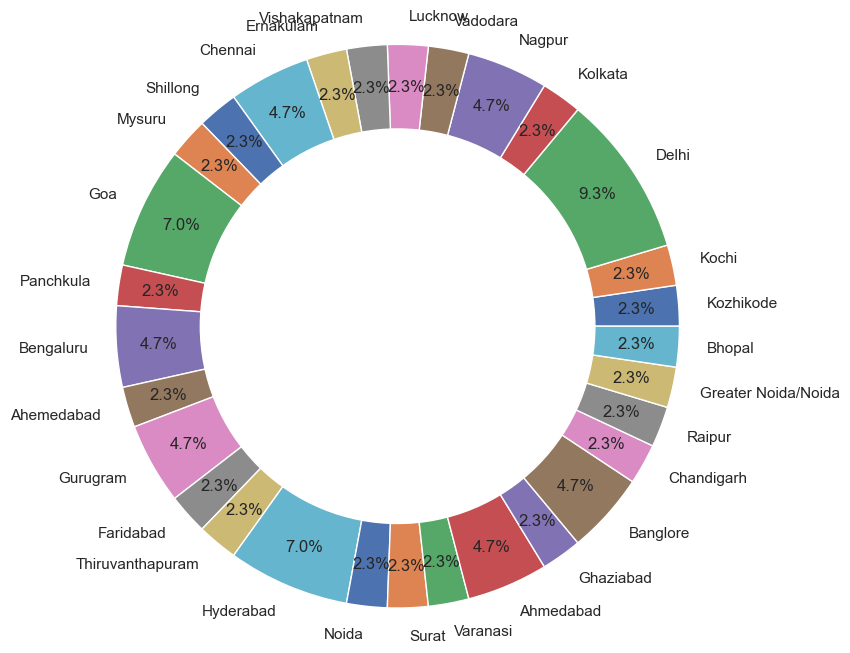

In [143]:
plot_City_count(df6)

In [144]:
def plot_esc_count(d):
    """
    Plot the count of ESC using Seaborn.

    Args:
        d (pandas.DataFrame): Data containing 'Brand' column.
    """
    plt.figure(figsize=(35, 20))
    sns.countplot(data=d, x='Energy Sector Companies')

    # Set labels and title
    plt.xlabel('ESC')
    plt.ylabel('Count')
    plt.title('No. of Energy Sector Companies')

    # Display the plot
    plt.show()

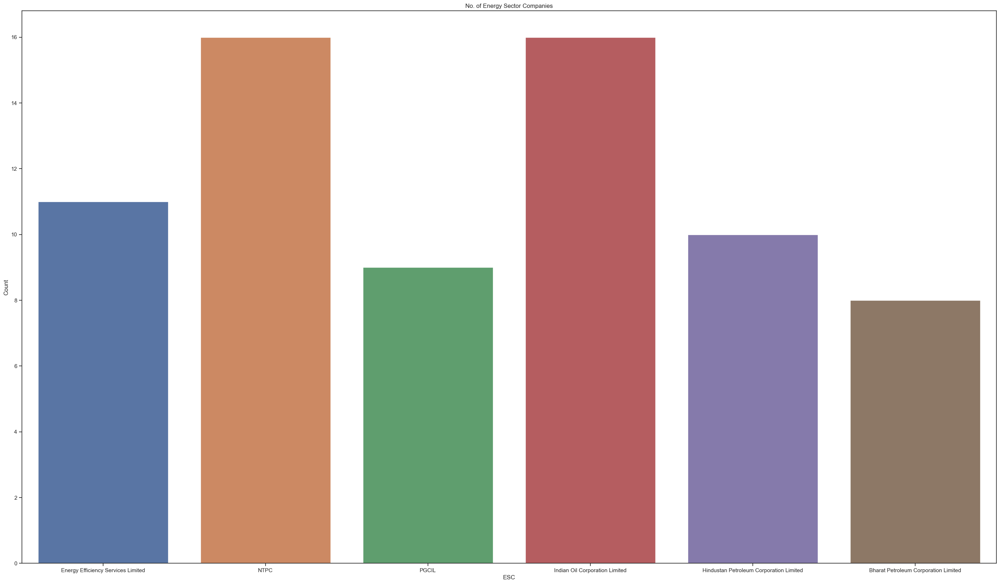

In [145]:
plot_esc_count(df6)

In [146]:
def preprocess_data(d):
    """
    Preprocess the data by converting columns to their respective representations.

    Args:
        d (pandas.DataFrame): Input data.

    Returns:
        pandas.DataFrame: Preprocessed data.
    """
    processed_data = d.copy()
    categorical_columns = processed_data.select_dtypes(include='object').columns
    numeric_columns = processed_data.select_dtypes(include=['int', 'float']).columns

    # Convert categorical columns
    processed_data[categorical_columns] = processed_data[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

    # Scale numeric columns
    scaler = StandardScaler()
    processed_data[numeric_columns] = scaler.fit_transform(processed_data[numeric_columns])

    return processed_data

In [147]:
preprocessed_data_6 = preprocess_data(df6)

In [148]:
def perform_pca(data):
    """
    Perform Principal Component Analysis (PCA) on the data.

    Args:
        data (pandas.DataFrame): Data to perform PCA on.

    Returns:
        numpy.ndarray: Resulting PCA components.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    pca = PCA()
    pca_res = pca.fit_transform(data_scaled)

    for iteration in range(pca.n_components_):
        print(f"PC{iteration + 1}")
        print(f"Standard deviation: {np.round(np.sqrt(pca.explained_variance_[iteration]), 4)}")
        print(f"Proportion of Variance: {np.round(pca.explained_variance_ratio_[iteration], 4)}")
        print(f"Cumulative Proportion: {np.round(np.sum(pca.explained_variance_ratio_[:iteration+1]), 4)}")
        print()

    return pca_res

In [149]:
pca_result_6 = perform_pca(preprocessed_data_6)

PC1
Standard deviation: 1.1272
Proportion of Variance: 0.3131
Cumulative Proportion: 0.3131

PC2
Standard deviation: 1.1163
Proportion of Variance: 0.3071
Cumulative Proportion: 0.6202

PC3
Standard deviation: 0.9377
Proportion of Variance: 0.2167
Cumulative Proportion: 0.8368

PC4
Standard deviation: 0.8137
Proportion of Variance: 0.1632
Cumulative Proportion: 1.0



In [150]:
def find_optimal_clusters(data, max_clusters=10, n_init=10):
    """
    Find the optimal number of clusters using the elbow method.

    Args:
        data (numpy.ndarray): Data to cluster.
        max_clusters (int): Maximum number of clusters to consider.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        int: Optimal number of clusters.
    """
    if max(abs(data.mean()), abs(data.std())) > 1e-8:
        scaler = StandardScaler()
        data = scaler.fit_transform(data)

    wcss = []
    for num_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=n_init)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # Calculate the optimal number of clusters
    differences = np.diff(wcss)
    avg_differences = differences[1:] / differences[:-1]

    optimal_clusters = np.argmax(avg_differences) + 1

    # Plot the WCSS values
    plt.plot(range(1, max_clusters + 1), wcss)
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    return optimal_clusters

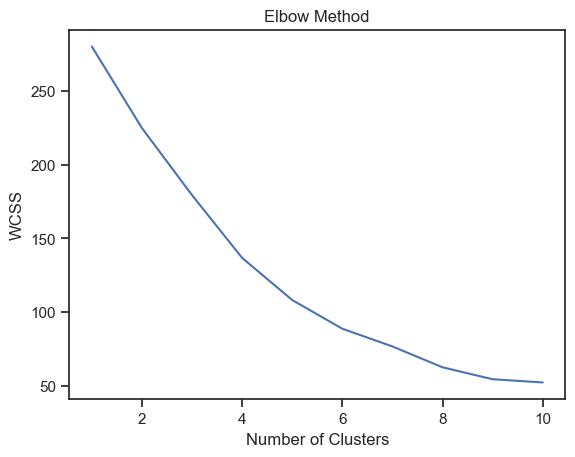

In [151]:
ideal_n_clusters_6 = find_optimal_clusters(pca_result_6)

In [152]:
ideal_n_clusters_6

6

In [153]:
def apply_kmeans_clustering(data, n_clusters, n_init=10):
    """
    Apply K-means Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        n_clusters (int): Number of clusters.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_init)
    clusters = kmeans.fit_predict(data_scaled)

    sns.set(style="ticks")
    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.suptitle('Scatter Plot with K-means Clusters', y=1.05)
    plt.show()

    return clusters

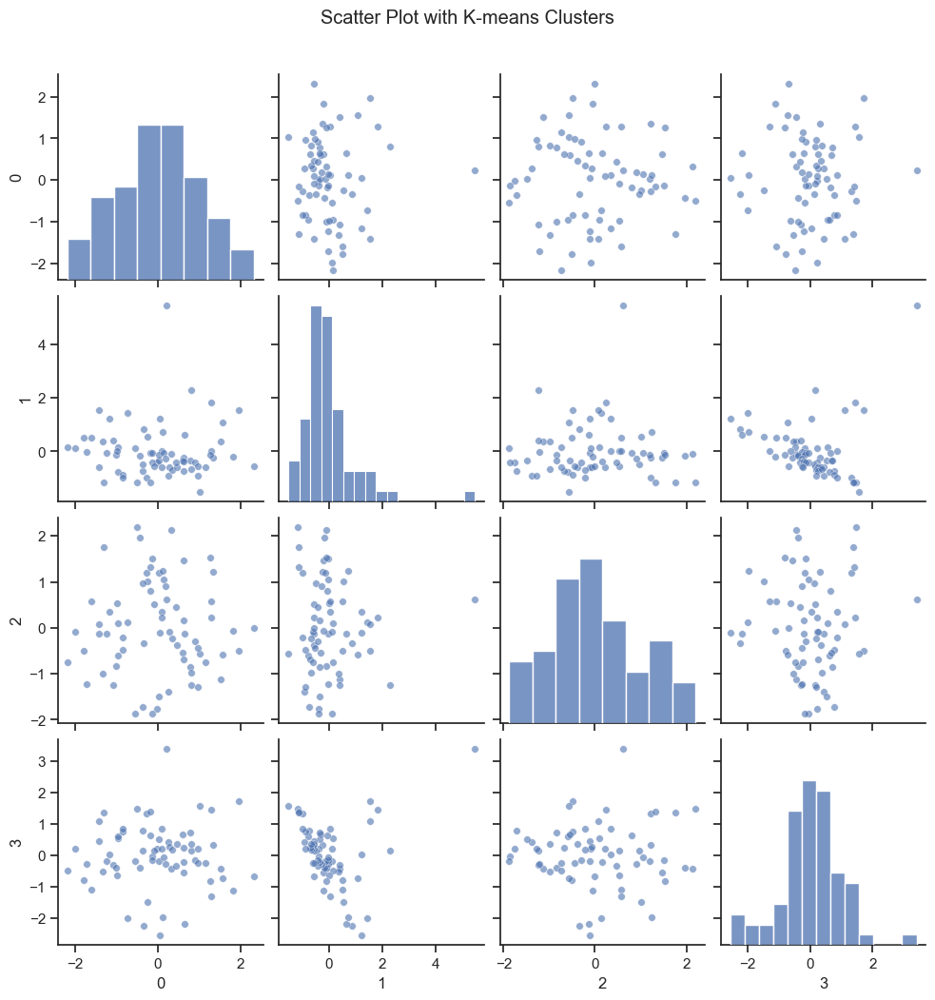

In [154]:
kmeans_clusters_6 = apply_kmeans_clustering(pca_result_6, ideal_n_clusters_6)

In [155]:
def apply_hierarchical_clustering(data, distance_threshold=None):
    """
    Apply Hierarchical Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        distance_threshold (float): The linkage distance threshold above which clusters will not be merged.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None)
    model.fit(data_scaled)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    dendrogram(linkage(data_scaled, method='ward'))
    plt.show()

    clusters = model.labels_

    print(f'Scatter Plot with Hierarchical Clusters (Number of Clusters: {len(np.unique(clusters))})')

    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.show()

    return clusters

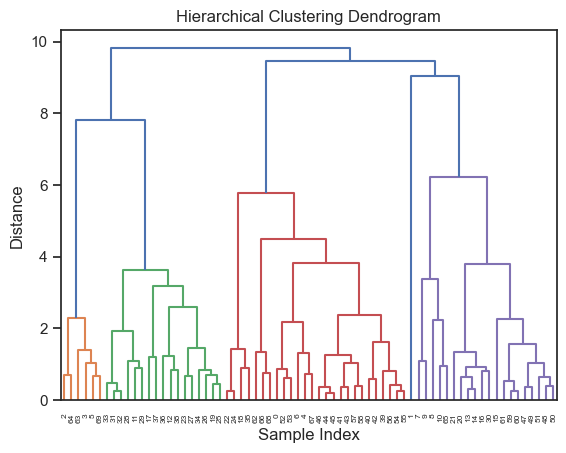

Scatter Plot with Hierarchical Clusters (Number of Clusters: 14)


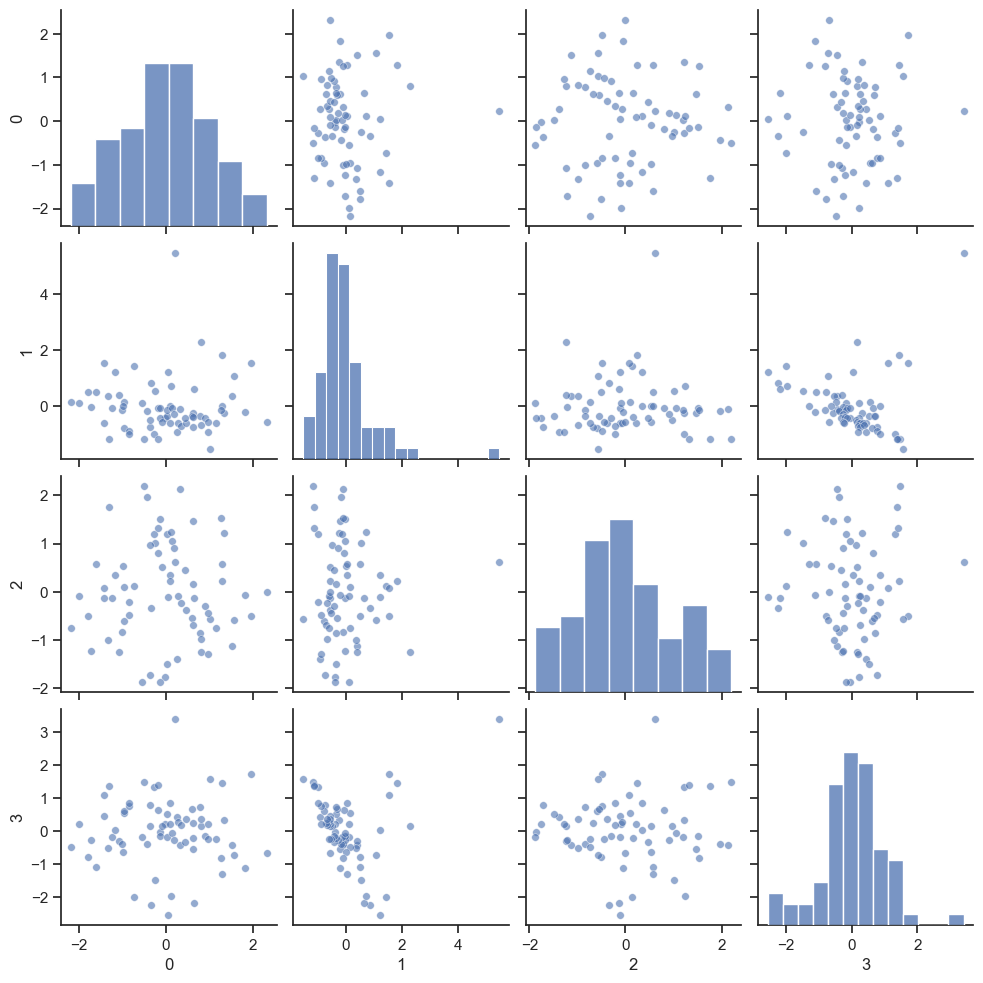

In [156]:
hierarchical_clusters_6 = apply_hierarchical_clustering(pca_result_6, distance_threshold=2.5)

In [157]:
def analyze_clusters(data, clusters):
    """
    Analyze the clusters by displaying cluster distribution and percentages.

    Args:
        data (pandas.DataFrame): Data with cluster labels.
        clusters (numpy.ndarray): Cluster labels.
    """
    data['Cluster'] = clusters

    cluster_counts = data['Cluster'].value_counts().sort_index()
    cluster_percentages = cluster_counts / cluster_counts.sum() * 100

    print("Cluster Distribution:")
    print(cluster_counts)
    print()
    print("Cluster Percentages:")
    print(cluster_percentages)

In [158]:
analyze_clusters(df6, kmeans_clusters_6)

Cluster Distribution:
Cluster
0    19
1     4
2    18
3    21
4     7
5     1
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    27.142857
1     5.714286
2    25.714286
3    30.000000
4    10.000000
5     1.428571
Name: count, dtype: float64


In [159]:
analyze_clusters(df6, hierarchical_clusters_6)

Cluster Distribution:
Cluster
0     13
1      6
2      3
3      6
4      9
5      6
6      4
7      1
8      3
9      6
10     6
11     2
12     2
13     3
Name: count, dtype: int64

Cluster Percentages:
Cluster
0     18.571429
1      8.571429
2      4.285714
3      8.571429
4     12.857143
5      8.571429
6      5.714286
7      1.428571
8      4.285714
9      8.571429
10     8.571429
11     2.857143
12     2.857143
13     4.285714
Name: count, dtype: float64


# Dataset - 8

In [16]:
file_path_6 = r'C:\Users\ashva\Work\christ\internship\Feynn Labs\Projects\Project 2\Codes\Code-2\EV-datasets\EV_BaseFileApril_23_final.xlsx'
df7 = pd.read_excel(file_path_6)
df7

,Sl. No.,DISCOMs,Major City,Month,No of EV Charging Stations excluding Heavy Duty Vehicles charging stations,No of PCS specific to Heavy Duty Vehicles (E-bus etc.),Electricity Consumed in EV Charging Stations (excluding Heavy Duty Vehicles PCS)\n(in Kwh),Electricity Consumed in Heavy Duty PCS Only (in Kwh),Total Electricity Consumed\n(in MU)
0,1,"Tata Power-DDL, Delhi",New Delhi,"April, 22",463,1,2000000,50000,2.050
1,1,"Tata Power-DDL, Delhi",New Delhi,"May, 22",527,1,2290000,10000,2.300
2,1,"Tata Power-DDL, Delhi",New Delhi,"June, 22",530,2,2160000,730000,2.890
3,1,"Tata Power-DDL, Delhi",New Delhi,"July, 22",535,2,2170000,1020000,3.190
4,1,"Tata Power-DDL, Delhi",New Delhi,"August, 22",543,2,2410000,1060000,3.470
...,...,...,...,...,...,...,...,...,...
370,29,"APDCL, Assam","Badarpur, Karimganj,kokrajhar, Nagaon, Silchar...","December, 22",44,3,92583,26569,0.119
371,29,"APDCL, Assam","Badarpur, Karimganj,kokrajhar, Nagaon, Silchar...","January, 23",53,3,94498,27821,0.122
372,29,"APDCL, Assam","Badarpur, Karimganj,kokrajhar, Nagaon, Silchar...","February, 23",0,0,0,0,0.000
373,29,"APDCL, Assam","Badarpur, Karimganj,kokrajhar, Nagaon, Silchar...","March, 23",0,0,0,0,0.000


In [161]:
df7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375 entries, 0 to 374
Data columns (total 9 columns):
 #   Column                                                                                     Non-Null Count  Dtype  
---  ------                                                                                     --------------  -----  
 0   Sl. No.                                                                                    375 non-null    int64  
 1   DISCOMs                                                                                    375 non-null    object 
 2   Major City                                                                                 375 non-null    object 
 3   Month                                                                                      375 non-null    object 
 4   No of EV Charging Stations excluding Heavy Duty Vehicles charging stations                 375 non-null    int64  
 5   No of PCS specific to Heavy Duty Vehicles (E-bus et

In [162]:
pd.isnull(df7).sum()

Sl. No.                                                                                       0
DISCOMs                                                                                       0
Major City                                                                                    0
Month                                                                                         0
No of EV Charging Stations excluding Heavy Duty Vehicles charging stations                    0
No of PCS specific to Heavy Duty Vehicles (E-bus etc.)                                        0
Electricity Consumed in EV Charging Stations (excluding Heavy Duty Vehicles PCS)\n(in Kwh)    0
Electricity Consumed in Heavy Duty PCS Only (in Kwh)                                          0
Total Electricity Consumed\n(in MU)                                                           0
dtype: int64

In [163]:
df7.describe()

,Sl. No.,No of EV Charging Stations excluding Heavy Duty Vehicles charging stations,No of PCS specific to Heavy Duty Vehicles (E-bus etc.),Electricity Consumed in EV Charging Stations (excluding Heavy Duty Vehicles PCS)\n(in Kwh),Electricity Consumed in Heavy Duty PCS Only (in Kwh),Total Electricity Consumed\n(in MU)
count,375.000000,375.000000,375.000000,3.750000e+02,3.750000e+02,375.000000
mean,19.768000,162.560000,1.850667,2.814370e+05,3.052837e+05,0.586743
std,9.496807,450.670441,3.431389,8.289309e+05,7.948775e+05,1.256367
min,1.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000
25%,13.500000,1.000000,0.000000,0.000000e+00,0.000000e+00,0.000000
50%,21.000000,9.000000,0.000000,3.717000e+03,0.000000e+00,0.006000
75%,28.000000,35.000000,2.000000,2.392700e+04,2.293915e+05,0.269000
max,39.000000,2583.000000,17.000000,4.044558e+06,6.071647e+06,6.245000


In [164]:
def plot_DISCOMs_count(data):
    """
    Plot the count of DISCOMs in the data.

    Args:
        data (pandas.DataFrame): Data containing 'Gender' column.
    """
    t=[]

    for index in df7['DISCOMs']:
        if index == 'Nil':
            break
        t.append(index)

    unique_list = list(set(t))

    sizes=[]
    for index in unique_list:
        if index == 'Nil':
            break
        sizes.append(data.query(f'DISCOMs == "{index}"').DISCOMs.count())

    plt.figure(figsize=(8, 8))
    my_circle = plt.Circle((0, 0), 0.7, color='white')

    plt.pie(
        sizes,
        labels=unique_list,
        autopct='%1.1f%%',
        pctdistance=0.85
    )

    p = plt.gcf()
    plt.axis('equal')
    p.gca().add_artist(my_circle)

    plt.show()

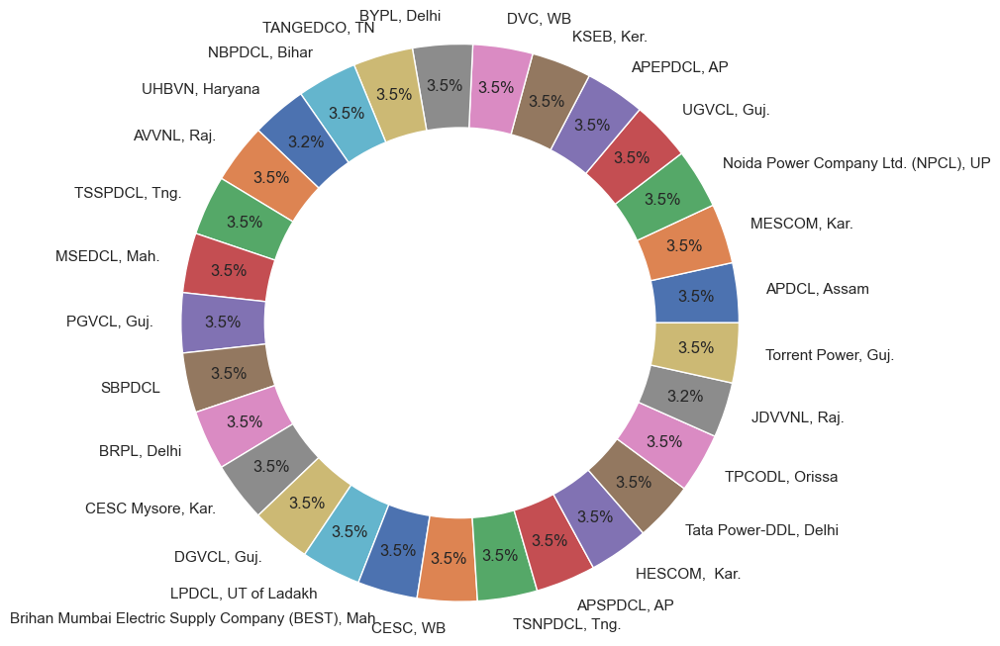

In [165]:
plot_DISCOMs_count(df7)

In [166]:
def preprocess_data(data):
    """
    Preprocess the data by converting columns to their respective representations.

    Args:
        data (pandas.DataFrame): Input data.

    Returns:
        pandas.DataFrame: Preprocessed data.
    """
    processed_data = data.copy()
    categorical_columns = processed_data.select_dtypes(include='object').columns
    numeric_columns = processed_data.select_dtypes(include=['int', 'float']).columns

    # Convert categorical columns
    processed_data[categorical_columns] = processed_data[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

    # Scale numeric columns
    scaler = StandardScaler()
    processed_data[numeric_columns] = scaler.fit_transform(processed_data[numeric_columns])

    return processed_data

In [167]:
preprocessed_data_7 = preprocess_data(df7)

In [168]:
def perform_pca(data):
    """
    Perform Principal Component Analysis (PCA) on the data.

    Args:
        data (pandas.DataFrame): Data to perform PCA on.

    Returns:
        numpy.ndarray: Resulting PCA components.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    pca = PCA()
    pca_res = pca.fit_transform(data_scaled)

    for iteration in range(pca.n_components_):
        print(f"PC{iteration + 1}")
        print(f"Standard deviation: {np.round(np.sqrt(pca.explained_variance_[iteration]), 4)}")
        print(f"Proportion of Variance: {np.round(pca.explained_variance_ratio_[iteration], 4)}")
        print(f"Cumulative Proportion: {np.round(np.sum(pca.explained_variance_ratio_[:iteration+1]), 4)}")
        print()

    return pca_res

In [169]:
pca_result_7 = perform_pca(preprocessed_data_7)

PC1
Standard deviation: 1.8876
Proportion of Variance: 0.3948
Cumulative Proportion: 0.3948

PC2
Standard deviation: 1.2567
Proportion of Variance: 0.175
Cumulative Proportion: 0.5698

PC3
Standard deviation: 1.0397
Proportion of Variance: 0.1198
Cumulative Proportion: 0.6896

PC4
Standard deviation: 1.0012
Proportion of Variance: 0.1111
Cumulative Proportion: 0.8007

PC5
Standard deviation: 0.9367
Proportion of Variance: 0.0972
Cumulative Proportion: 0.8979

PC6
Standard deviation: 0.6924
Proportion of Variance: 0.0531
Cumulative Proportion: 0.9511

PC7
Standard deviation: 0.5739
Proportion of Variance: 0.0365
Cumulative Proportion: 0.9876

PC8
Standard deviation: 0.3349
Proportion of Variance: 0.0124
Cumulative Proportion: 1.0

PC9
Standard deviation: 0.0001
Proportion of Variance: 0.0
Cumulative Proportion: 1.0



In [170]:
def find_optimal_clusters(data, max_clusters=10, n_init=10):
    """
    Find the optimal number of clusters using the elbow method.

    Args:
        data (numpy.ndarray): Data to cluster.
        max_clusters (int): Maximum number of clusters to consider.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        int: Optimal number of clusters.
    """
    if max(abs(data.mean()), abs(data.std())) > 1e-8:
        scaler = StandardScaler()
        data = scaler.fit_transform(data)

    wcss = []
    for num_clusters in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=n_init)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # Calculate the optimal number of clusters
    differences = np.diff(wcss)
    avg_differences = differences[1:] / differences[:-1]

    optimal_clusters = np.argmax(avg_differences) + 1

    # Plot the WCSS values
    plt.plot(range(1, max_clusters + 1), wcss)
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    return optimal_clusters

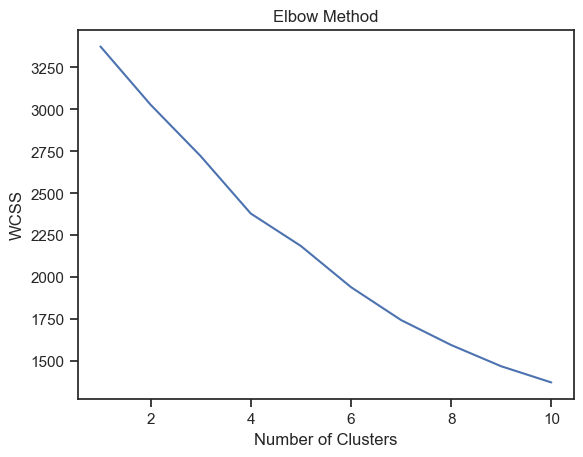

In [171]:
ideal_n_clusters_7 = find_optimal_clusters(pca_result_7)

In [172]:
ideal_n_clusters_7

4

In [184]:
def apply_kmeans_clustering(data, n_clusters, n_init=10):
    """
    Apply K-means Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        n_clusters (int): Number of clusters.
        n_init (int): Number of times the k-means algorithm will be run with different centroid seeds.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_init)
    clusters = kmeans.fit_predict(data_scaled)

    sns.set(style="ticks")
    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.suptitle('Scatter Plot with K-means Clusters', y=1.05)
    plt.show()

    return clusters

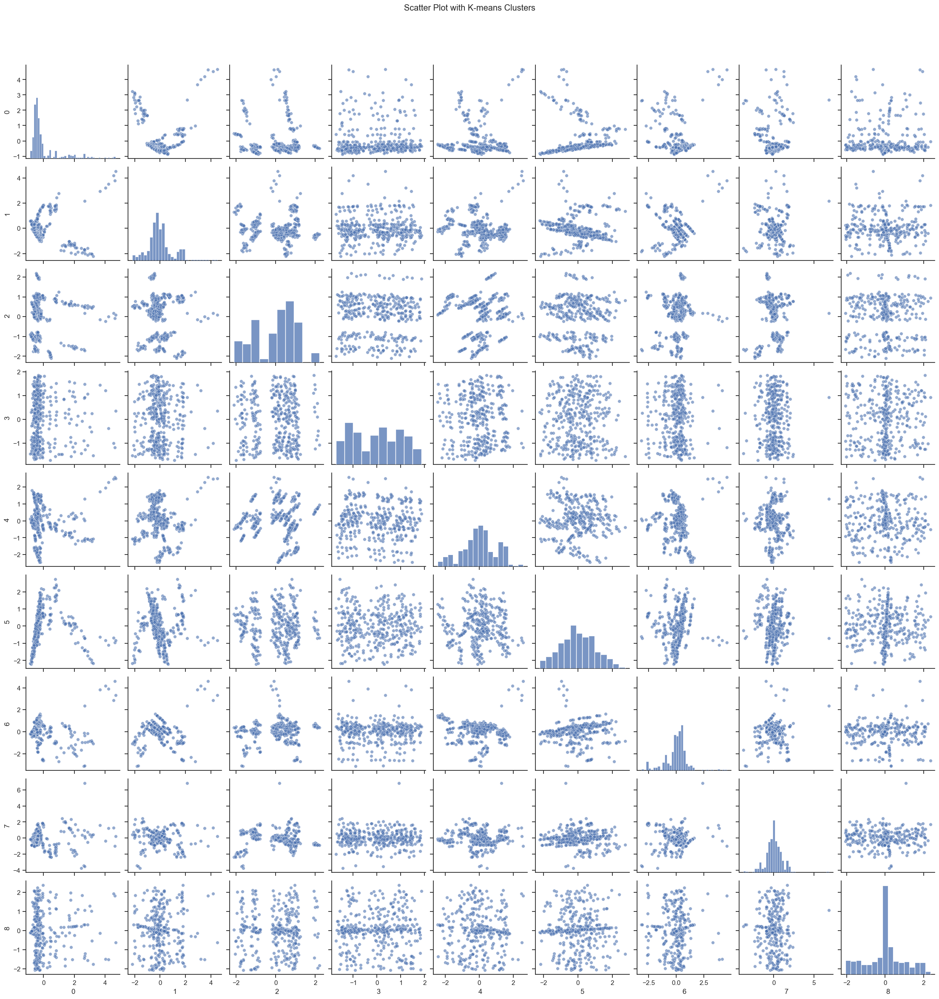

In [185]:
kmeans_clusters_7 = apply_kmeans_clustering(pca_result_7, ideal_n_clusters_7)

In [186]:
def apply_hierarchical_clustering(data, distance_threshold=None):
    """
    Apply Hierarchical Clustering Algorithm to the data.

    Args:
        data (numpy.ndarray): Data to cluster.
        distance_threshold (float): The linkage distance threshold above which clusters will not be merged.

    Returns:
        numpy.ndarray: Cluster labels.
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    model = AgglomerativeClustering(distance_threshold=distance_threshold, n_clusters=None)
    model.fit(data_scaled)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    dendrogram(linkage(data_scaled, method='ward'))
    plt.show()

    clusters = model.labels_

    print(f'Scatter Plot with Hierarchical Clusters (Number of Clusters: {len(np.unique(clusters))})')

    sns.pairplot(pd.DataFrame(data_scaled), plot_kws={'alpha': 0.6, 's': 30})
    plt.show()

    return clusters

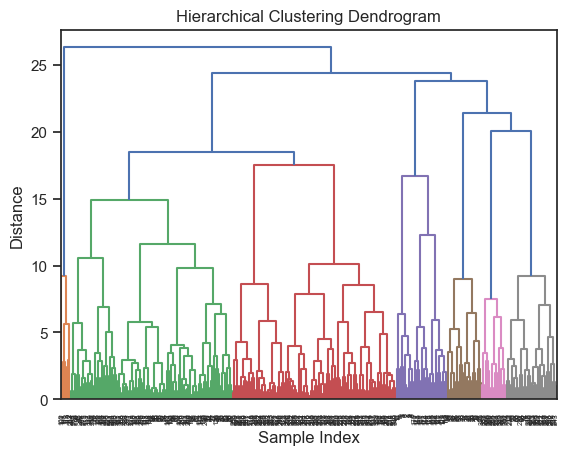

Scatter Plot with Hierarchical Clusters (Number of Clusters: 94)


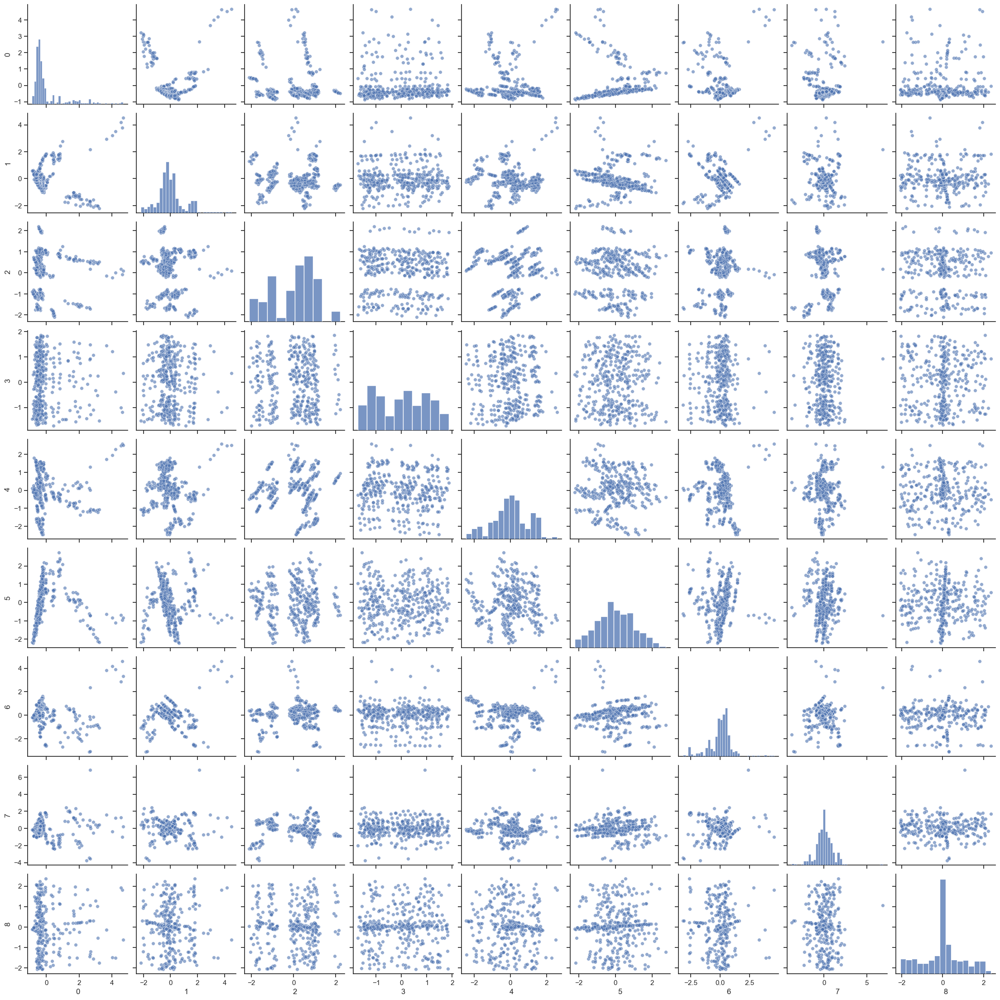

In [187]:
hierarchical_clusters_7 = apply_hierarchical_clustering(pca_result_7, distance_threshold=2.5)

In [177]:
def analyze_clusters(data, clusters):
    """
    Analyze the clusters by displaying cluster distribution and percentages.

    Args:
        data (pandas.DataFrame): Data with cluster labels.
        clusters (numpy.ndarray): Cluster labels.
    """
    data['Cluster'] = clusters

    cluster_counts = data['Cluster'].value_counts().sort_index()
    cluster_percentages = cluster_counts / cluster_counts.sum() * 100

    print("Cluster Distribution:")
    print(cluster_counts)
    print()
    print("Cluster Percentages:")
    print(cluster_percentages)

In [178]:
analyze_clusters(df7, kmeans_clusters_7)

Cluster Distribution:
Cluster
0     39
1    181
2      7
3    148
Name: count, dtype: int64

Cluster Percentages:
Cluster
0    10.400000
1    48.266667
2     1.866667
3    39.466667
Name: count, dtype: float64


In [179]:
analyze_clusters(df7, hierarchical_clusters_7)

Cluster Distribution:
Cluster
0     5
1     4
2     6
3     6
4     6
     ..
89    2
90    3
91    1
92    1
93    1
Name: count, Length: 94, dtype: int64

Cluster Percentages:
Cluster
0     1.333333
1     1.066667
2     1.600000
3     1.600000
4     1.600000
        ...   
89    0.533333
90    0.800000
91    0.266667
92    0.266667
93    0.266667
Name: count, Length: 94, dtype: float64
